# Practical introducton to LLM generation and decoding strategies

In this tutorial we are going to discuss:
- How load models from huggingface using the transformer library
- How to prepare and fed text into an LLM
- The .generate() function
- Text generation and decoding strategies:
  - Greedy search
  - Sampling
  - Temperature sampling
  - TopK sampling
  - Nucleus sampling
  - Repetition penalty


## The official library of huggingface: "[transformers](https://huggingface.co/docs/transformers/en/index)"
### Library import, model and tokenizer

In [1]:
#!pip install transformers
#!pip install torch

from transformers import GPT2Tokenizer, GPT2LMHeadModel
import torch

# for plotting
import matplotlib.pyplot as plt

In [2]:
# model card: https://huggingface.co/openai-community/gpt2-medium

model = GPT2LMHeadModel.from_pretrained("openai-community/gpt2-medium") # model
tokenizer = GPT2Tokenizer.from_pretrained("openai-community/gpt2-medium") # tokenizer
model.generation_config.pad_token_id = tokenizer.eos_token_id

/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/718 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/1.52G [00:00<?, ?B/s]

generation_config.json:   0%|          | 0.00/124 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/26.0 [00:00<?, ?B/s]

vocab.json: 0.00B [00:00, ?B/s]

merges.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

In [3]:
# let's check the model's internal modules
print(model)
# wte: word token embeddings
# wpe: word positional embeddings

# check: https://jalammar.github.io/illustrated-transformer/ for more details on each component!

GPT2LMHeadModel(
  (transformer): GPT2Model(
    (wte): Embedding(50257, 1024)
    (wpe): Embedding(1024, 1024)
    (drop): Dropout(p=0.1, inplace=False)
    (h): ModuleList(
      (0-23): 24 x GPT2Block(
        (ln_1): LayerNorm((1024,), eps=1e-05, elementwise_affine=True)
        (attn): GPT2Attention(
          (c_attn): Conv1D(nf=3072, nx=1024)
          (c_proj): Conv1D(nf=1024, nx=1024)
          (attn_dropout): Dropout(p=0.1, inplace=False)
          (resid_dropout): Dropout(p=0.1, inplace=False)
        )
        (ln_2): LayerNorm((1024,), eps=1e-05, elementwise_affine=True)
        (mlp): GPT2MLP(
          (c_fc): Conv1D(nf=4096, nx=1024)
          (c_proj): Conv1D(nf=1024, nx=4096)
          (act): NewGELUActivation()
          (dropout): Dropout(p=0.1, inplace=False)
        )
      )
    )
    (ln_f): LayerNorm((1024,), eps=1e-05, elementwise_affine=True)
  )
  (lm_head): Linear(in_features=1024, out_features=50257, bias=False)
)


The decoder architecture:


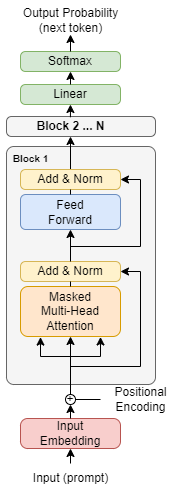

In [4]:
# How many parameters? You can find it in the model card most of the time, otherwise you can count:
total_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print(total_params)

354823168


In [5]:
# Let's check the tokenizer
print(tokenizer)
print("\n")
print(tokenizer.get_vocab())

GPT2Tokenizer(name_or_path='openai-community/gpt2-medium', vocab_size=50257, model_max_length=1024, is_fast=False, padding_side='right', truncation_side='right', special_tokens={'bos_token': '<|endoftext|>', 'eos_token': '<|endoftext|>', 'unk_token': '<|endoftext|>'}, clean_up_tokenization_spaces=False, added_tokens_decoder={
	50256: AddedToken("<|endoftext|>", rstrip=False, lstrip=False, single_word=False, normalized=True, special=True),
}
)


{'!': 0, '"': 1, '#': 2, '$': 3, '%': 4, '&': 5, "'": 6, '(': 7, ')': 8, '*': 9, '+': 10, ',': 11, '-': 12, '.': 13, '/': 14, '0': 15, '1': 16, '2': 17, '3': 18, '4': 19, '5': 20, '6': 21, '7': 22, '8': 23, '9': 24, ':': 25, ';': 26, '<': 27, '=': 28, '>': 29, '?': 30, '@': 31, 'A': 32, 'B': 33, 'C': 34, 'D': 35, 'E': 36, 'F': 37, 'G': 38, 'H': 39, 'I': 40, 'J': 41, 'K': 42, 'L': 43, 'M': 44, 'N': 45, 'O': 46, 'P': 47, 'Q': 48, 'R': 49, 'S': 50, 'T': 51, 'U': 52, 'V': 53, 'W': 54, 'X': 55, 'Y': 56, 'Z': 57, '[': 58, '\\': 59, ']': 60, '^': 61, '

## Let's generate some text given an input text (aka prompt)

### 1) Input encoding:
- Segment text into tokens
- Extract the token ids
- Extract the attention mask

In [6]:
input_text = "I like pesto with"
encoded_input = tokenizer(input_text, return_tensors="pt") # "pt" = pytorch tensor
print("Encoded input:", encoded_input)
print("Tokenization splitting:", tokenizer.tokenize(input_text))

Encoded input: {'input_ids': tensor([[   40,   588, 28064,    78,   351]]), 'attention_mask': tensor([[1, 1, 1, 1, 1]])}
Tokenization splitting: ['I', 'Ġlike', 'Ġpest', 'o', 'Ġwith']


### 2) Generation:
- We definte a set of parameters for the generation (generation_config)
- We pass the encoded input to the model using the .generate() function


In [7]:
# let's define just one basic parameter
max_new_tokens = 30
generation_config = {"max_new_tokens": max_new_tokens}
# parameters: https://huggingface.co/docs/transformers/v4.57.1/en/main_classes/text_generation#transformers.GenerationConfig
# .generate() function: https://huggingface.co/docs/transformers/v4.57.1/en/main_classes/text_generation
out = model.generate(**encoded_input, return_dict_in_generate=True, output_logits = True, **generation_config)

# logits: the raw scores the model generates for each potential output

print(out.keys()) # ['sequences', 'logits', 'past_key_values']

print(out)

print(out["sequences"].shape) # is a tensor
print(out["logits"][0].shape) # is a tuple of tensors, one for each token

odict_keys(['sequences', 'logits', 'past_key_values'])
GenerateDecoderOnlyOutput(sequences=tensor([[   40,   588, 28064,    78,   351,   257,  1310,  1643,   286, 19450,
          3056,    11,   475,   314,   836,   470,   588,   340,  1165,   881,
            13,   314,   588,   340,   257,  1310,  1643,   517,   351,   257,
          1310,  1643,   286, 19450,  3056]]), scores=None, logits=(tensor([[ -92.6668,  -94.0442, -101.0335,  ..., -103.8911,  -99.0834,
          -94.6066]]), tensor([[-100.0378, -100.5861, -104.4439,  ..., -110.0308, -105.3091,
         -102.1280]]), tensor([[-101.7505, -103.8703, -110.7366,  ..., -113.9814, -109.5225,
         -103.1886]]), tensor([[56.2739, 53.7715, 46.3678,  ..., 42.8843, 45.3422, 53.2687]]), tensor([[-109.7260, -110.5590, -117.7489,  ..., -121.1848, -116.8419,
         -110.8924]]), tensor([[-48.2565, -49.5644, -57.4379,  ..., -63.7334, -59.2436, -51.1460]]), tensor([[-72.3828, -74.8808, -82.2459,  ..., -91.4816, -86.6096, -76.3175]]), tens

### 3) Text detokenization:
- Map the generated token ids to the corresponding tokens and get the generated text

In [8]:
decoded_sequence = tokenizer.batch_decode(out["sequences"])[0]
print(decoded_sequence)

# There are reptitions... The Curious Case of Neural Text Degeneration: https://arxiv.org/abs/1904.09751

I like pesto with a little bit of olive oil, but I don't like it too much. I like it a little bit more with a little bit of olive oil


## There are several decoding strategies:
- Deterministic:
  - *Greedy search*
  - Beam search
- Non-deterministic:
  - *Sampling*
  - *Temperature sampling*
  - *TopK sampling*
  - *Nucleus sampling*
- More advanced
  - Diverse beam search
  - DoLa
  - Speculative decoding

Moreover, there are ways to avoid specific tokens (bad_words_ids), to penalize reptitions (repetition penalty), longer texts and so on...


### It's easy with the .generate() function...

In [9]:
max_new_tokens = 30
generation_config = {"max_new_tokens": max_new_tokens, "do_sample": False}
out = model.generate(**encoded_input, return_dict_in_generate=True, output_logits = True, **generation_config)
decoded_sequence = tokenizer.batch_decode(out["sequences"])[0]
print("Greedy search:", decoded_sequence)

generation_config = {"max_new_tokens": max_new_tokens, "num_beams": 4}
out = model.generate(**encoded_input, return_dict_in_generate=True, output_logits = True, **generation_config)
decoded_sequence = tokenizer.batch_decode(out["sequences"])[0]
print("Beam search:", decoded_sequence)

generation_config = {"max_new_tokens": max_new_tokens, "do_sample": True, "temperature": 1.0}
out = model.generate(**encoded_input, return_dict_in_generate=True, output_logits = True, **generation_config)
decoded_sequence = tokenizer.batch_decode(out["sequences"])[0]
print("Sampling:", decoded_sequence)

generation_config = {"max_new_tokens": max_new_tokens, "do_sample": True, "temperature": 0.7}
out = model.generate(**encoded_input, return_dict_in_generate=True, output_logits = True, **generation_config)
decoded_sequence = tokenizer.batch_decode(out["sequences"])[0]
print("Sampling with temperature:", decoded_sequence)

generation_config = {"max_new_tokens": max_new_tokens, "do_sample": True, "temperature": 0.7, "top_k": 20}
out = model.generate(**encoded_input, return_dict_in_generate=True, output_logits = True, **generation_config)
decoded_sequence = tokenizer.batch_decode(out["sequences"])[0]
print("Sampling top_k:", decoded_sequence)

generation_config = {"max_new_tokens": max_new_tokens, "do_sample": True, "temperature": 0.7, "top_k": 20, "top_p": 0.95}
out = model.generate(**encoded_input, return_dict_in_generate=True, output_logits = True, **generation_config)
decoded_sequence = tokenizer.batch_decode(out["sequences"])[0]
print("Nucleus sampling:", decoded_sequence)

Greedy search: I like pesto with a little bit of olive oil, but I don't like it too much. I like it a little bit more with a little bit of olive oil
Beam search: I like pesto with olive oil, but you can use any kind of olive oil you like.

I like pesto with olive oil, but you can use any
Sampling: I like pesto with tomatoes. It just gets better.

I'm a little concerned about how much vinegar you need. But I've had a few batches last week
Sampling with temperature: I like pesto with my pasta. And I've been making it with chickpeas for years.

Ingredients:

3 large whole wheat pasta, drained

Sampling top_k: I like pesto with red peppers. It's not super spicy but that's what I'm looking for. I've always wanted a pesto recipe that was a bit more
Nucleus sampling: I like pesto with this sauce. It has a nice flavor and it's perfect for making pasta dishes. I've been making it with pesto for about a month now


## Generation is a search problem!
That is, to explore an hypothesis space in order to find the "best" solution.

This is an important bottleneck in LLMs: a lot of information cab be interpolated by the model, but it's difficult to extract it!

### Implementing a generate function with the decoding strategies showed above
Basic logits manipulation:
- logits, prior to applying softmax, could be negative, or greater than one; and might not sum to 1; but after applying softmax, each component will be in the interval (0, 1), and the components will add up to 1, so that they can be interpreted as probabilities

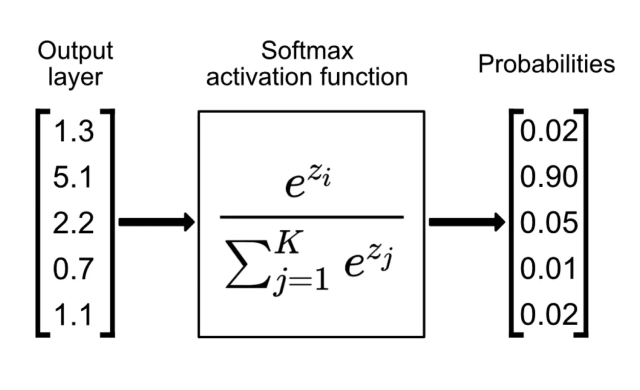


tensor([0.0205, 0.9177, 0.0505, 0.0113])


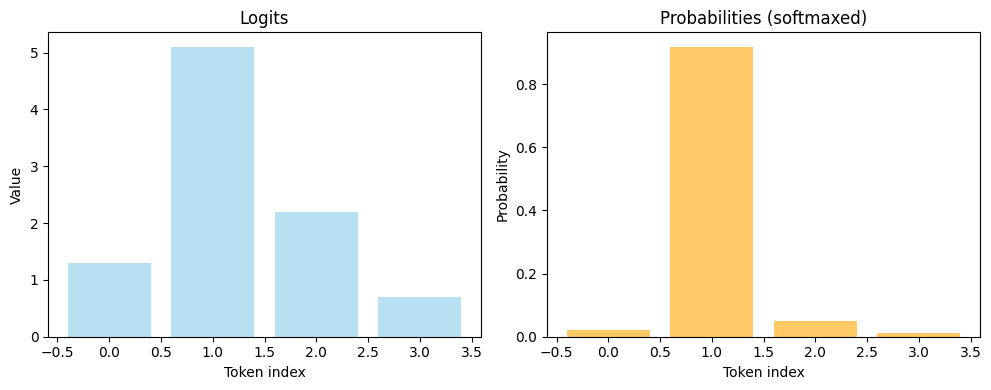

In [10]:
# for example
example_logits = torch.tensor([1.3, 5.1, 2.2, 0.7])
example_probs = torch.nn.functional.softmax(example_logits, dim=-1)
print(example_probs)

# visualize logits vs probabilities

fig, axes = plt.subplots(1, 2, figsize=(10, 4))

axes[0].bar(range(len(example_logits)), example_logits, color='skyblue', alpha=0.6)
axes[0].set_title("Logits")
axes[0].set_xlabel("Token index")
axes[0].set_ylabel("Value")

axes[1].bar(range(len(example_probs)), example_probs, color='orange', alpha=0.6)
axes[1].set_title("Probabilities (softmaxed)")
axes[1].set_xlabel("Token index")
axes[1].set_ylabel("Probability")

plt.tight_layout()
plt.show()

In [11]:
# plot function

def plot_logits(probs, token_ids, picked_token_id, first_k=20, vline=None, compute_entropy=False):

    probs_to_plot = probs[:first_k]
    ids_to_plot = token_ids[:first_k]
    tokens = tokenizer.convert_ids_to_tokens(ids_to_plot.tolist())

    plt.figure(figsize=(25, 5))
    bars = plt.bar(tokens, probs_to_plot)

    for i, tok_id in enumerate(ids_to_plot):
        if tok_id.item() == picked_token_id:
            bars[i].set_color('red')
            break

    if compute_entropy:
        ent = - (probs * torch.log(probs + 1e-12)).sum().item() # entropy computation
        plt.title(f"Distribution entropy: {ent:.4f}")

    if vline is not None:
        plt.axvline(x=vline, color='grey', linestyle='--')

    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

Entropy (H) is measured as:

$H(X) = - \sum_{i=1}^{n} p(x_i) \log_2 p(x_i)$

It expresses the amount of uncertainty (information) in a distribution. The higher the entropy the more a distribution is uniform, hence it can be used to assess the model uncertainty on the next token prediction

### Greedy search: the most probable token is picked

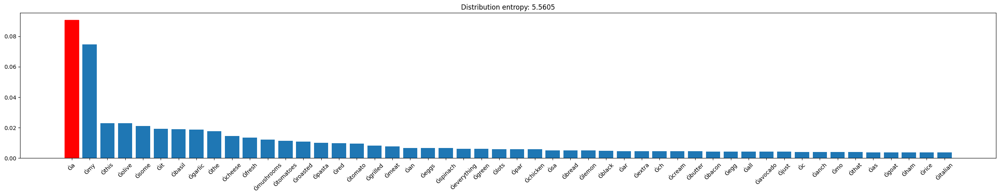

I like pesto with a


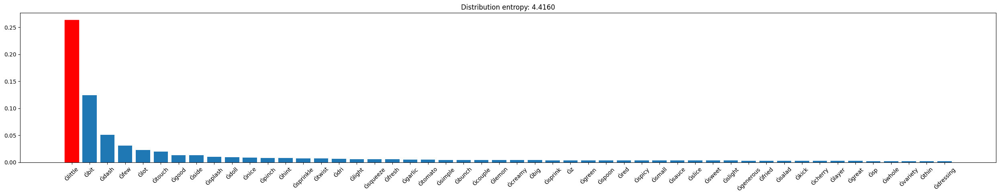

I like pesto with a little


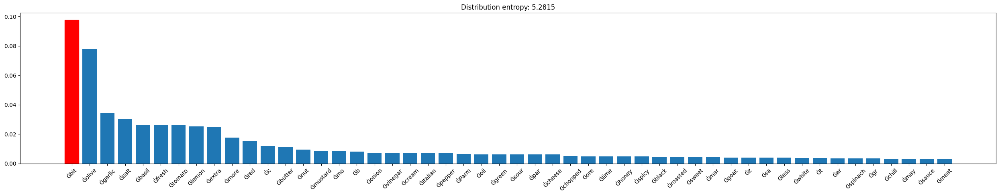

I like pesto with a little bit


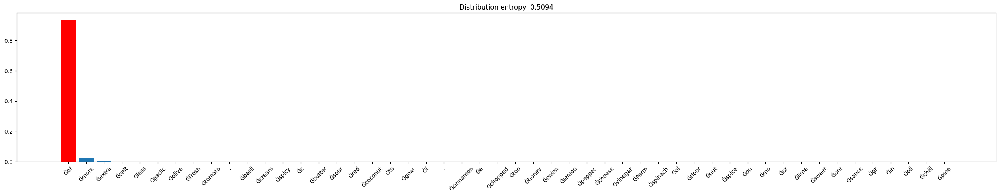

I like pesto with a little bit of


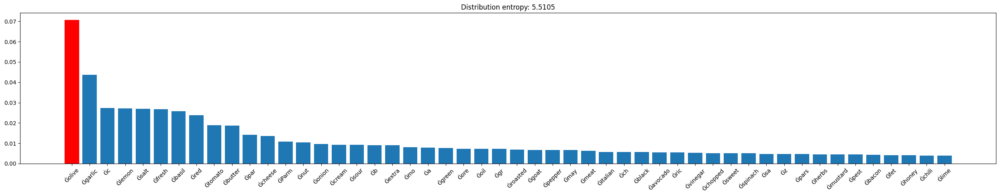

I like pesto with a little bit of olive


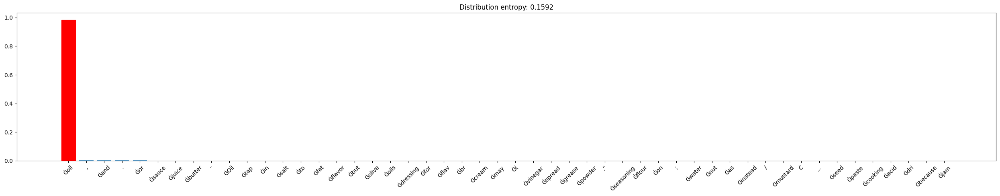

I like pesto with a little bit of olive oil


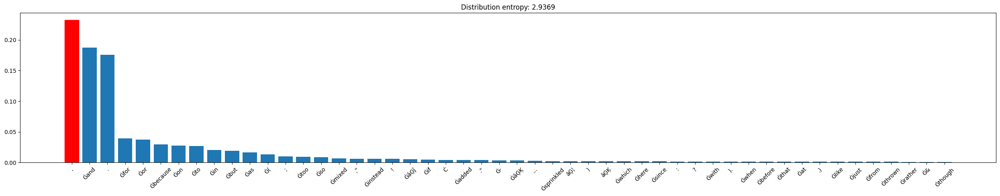

I like pesto with a little bit of olive oil,


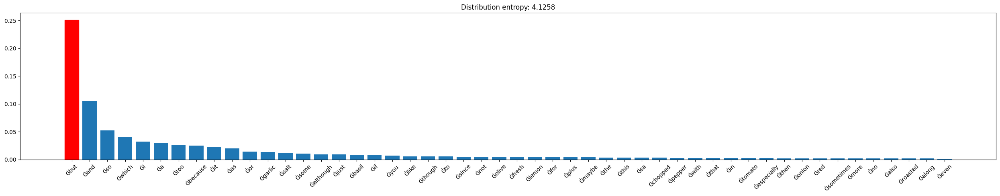

I like pesto with a little bit of olive oil, but


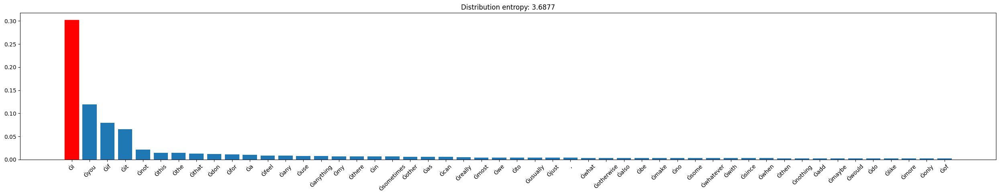

I like pesto with a little bit of olive oil, but I


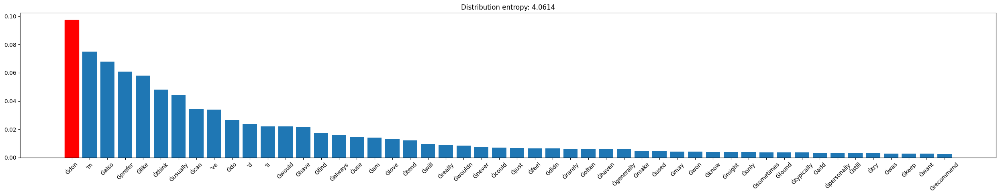

I like pesto with a little bit of olive oil, but I don


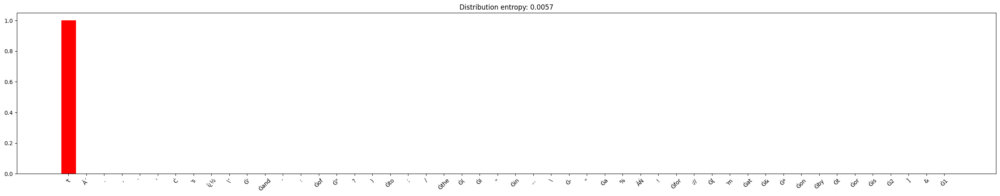

I like pesto with a little bit of olive oil, but I don't


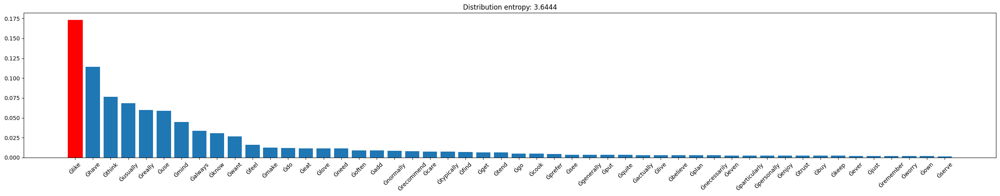

I like pesto with a little bit of olive oil, but I don't like


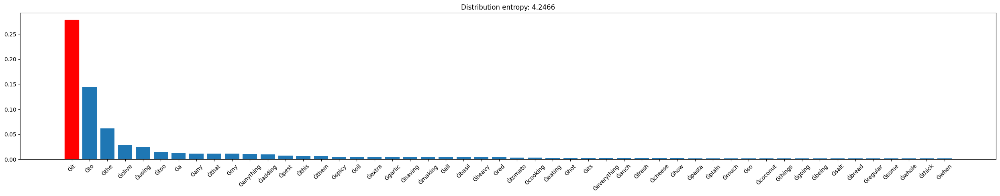

I like pesto with a little bit of olive oil, but I don't like it


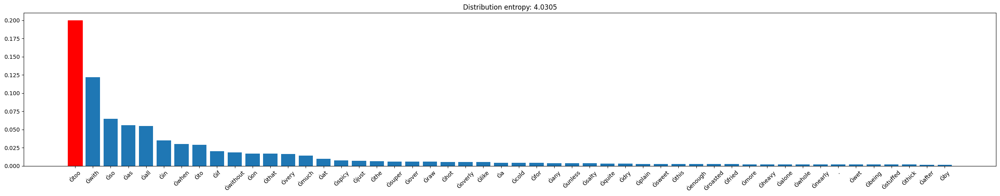

I like pesto with a little bit of olive oil, but I don't like it too


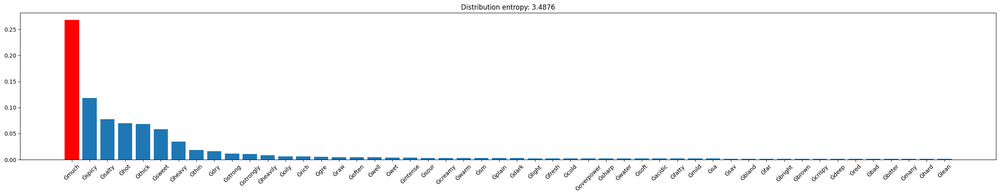

I like pesto with a little bit of olive oil, but I don't like it too much


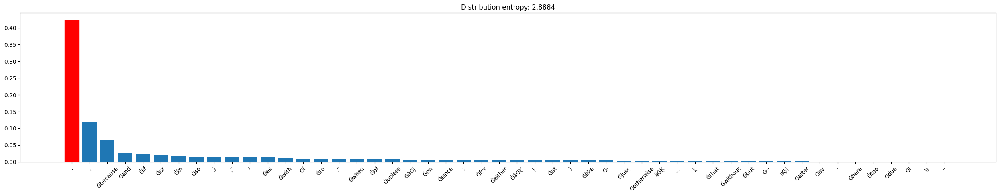

I like pesto with a little bit of olive oil, but I don't like it too much.


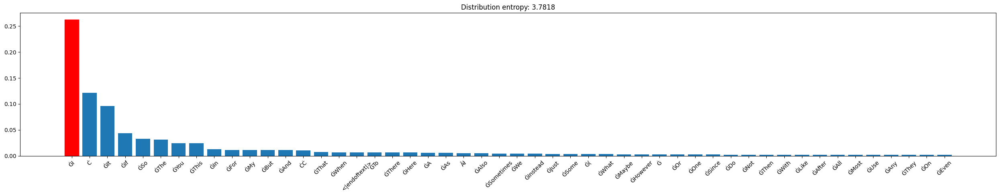

I like pesto with a little bit of olive oil, but I don't like it too much. I


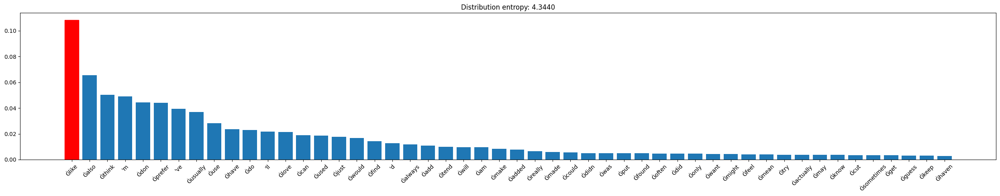

I like pesto with a little bit of olive oil, but I don't like it too much. I like


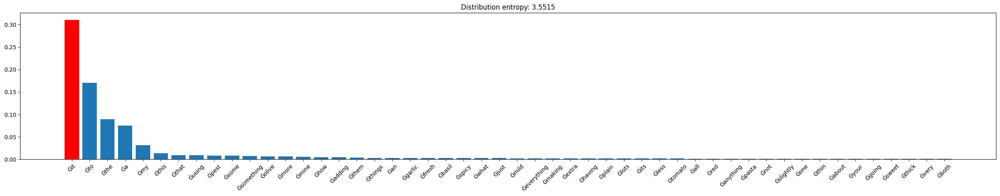

I like pesto with a little bit of olive oil, but I don't like it too much. I like it


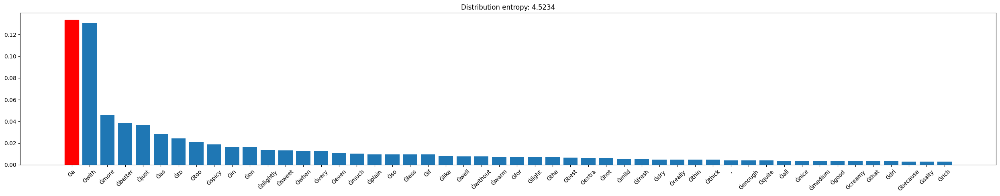

I like pesto with a little bit of olive oil, but I don't like it too much. I like it a


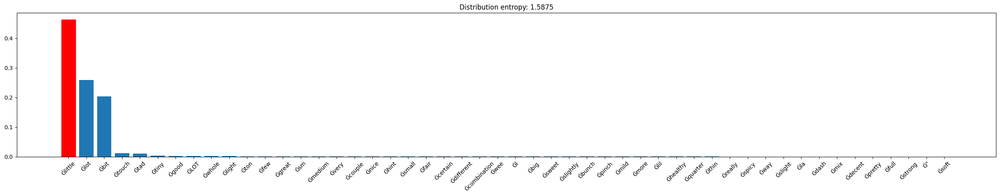

I like pesto with a little bit of olive oil, but I don't like it too much. I like it a little


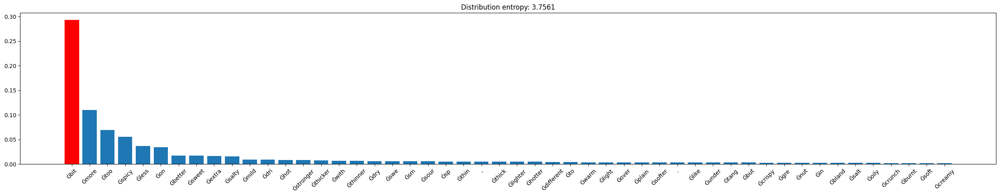

I like pesto with a little bit of olive oil, but I don't like it too much. I like it a little bit


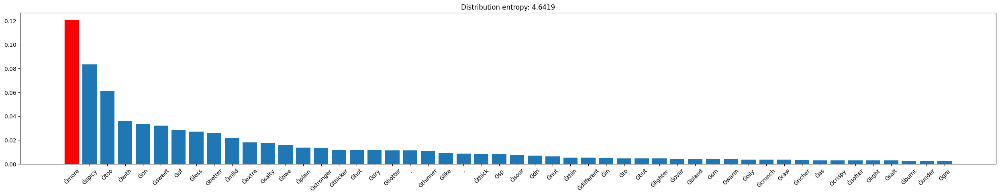

I like pesto with a little bit of olive oil, but I don't like it too much. I like it a little bit more


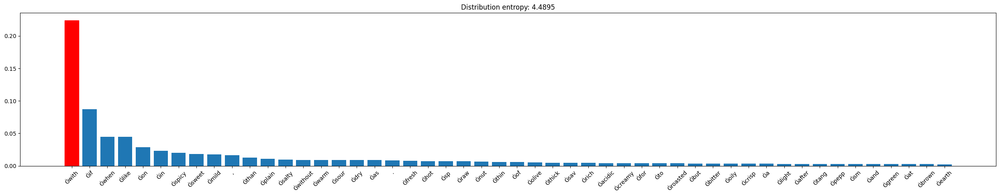

I like pesto with a little bit of olive oil, but I don't like it too much. I like it a little bit more with


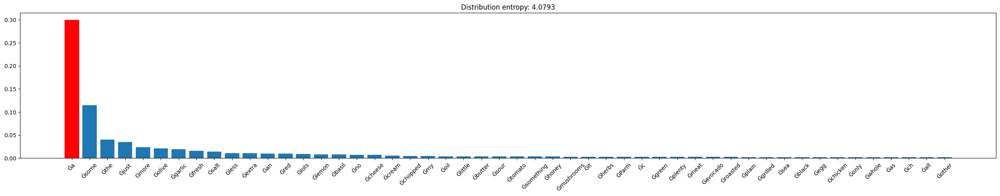

I like pesto with a little bit of olive oil, but I don't like it too much. I like it a little bit more with a


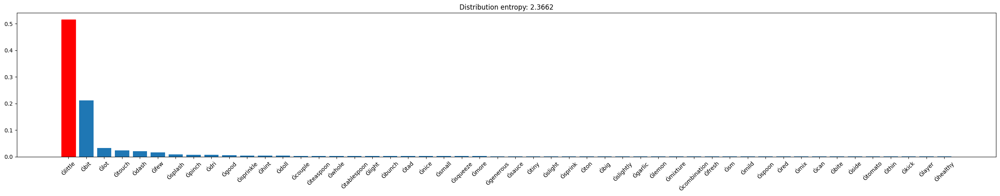

I like pesto with a little bit of olive oil, but I don't like it too much. I like it a little bit more with a little


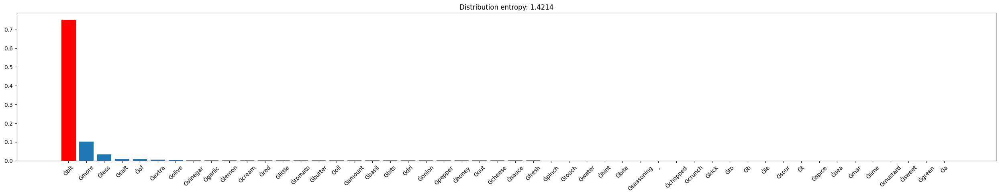

I like pesto with a little bit of olive oil, but I don't like it too much. I like it a little bit more with a little bit


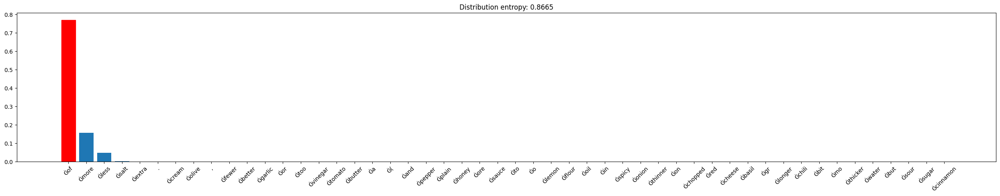

I like pesto with a little bit of olive oil, but I don't like it too much. I like it a little bit more with a little bit of


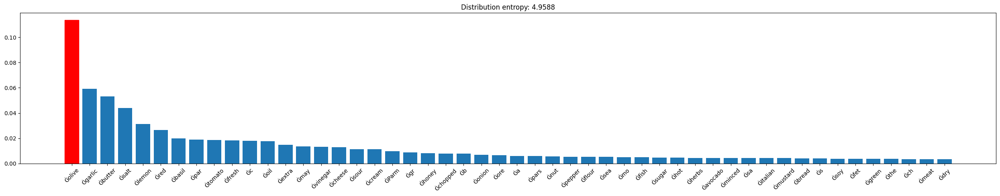

I like pesto with a little bit of olive oil, but I don't like it too much. I like it a little bit more with a little bit of olive


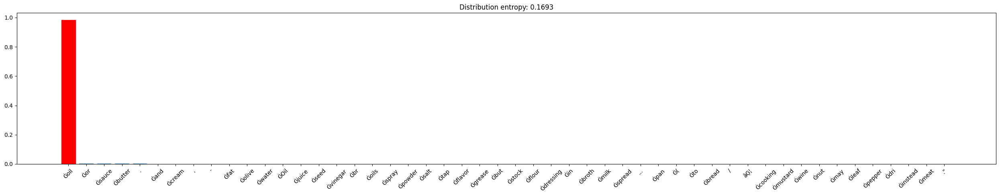

I like pesto with a little bit of olive oil, but I don't like it too much. I like it a little bit more with a little bit of olive oil


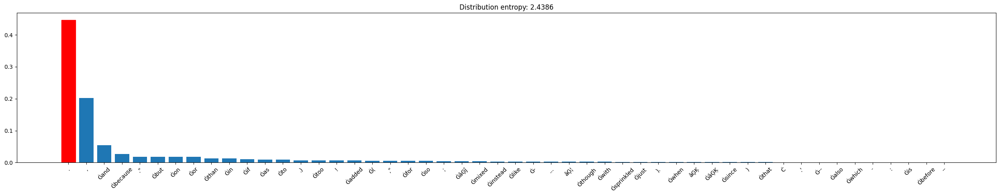

I like pesto with a little bit of olive oil, but I don't like it too much. I like it a little bit more with a little bit of olive oil.


In [12]:
def greedy_generate(logits, plot = False):
  probabilities = torch.nn.functional.softmax(logits, dim=-1) # transform logits into probabilities
  token = torch.argmax(probabilities).item()
  if plot:
    sorted_probabilities, sorted_ids = torch.sort(probabilities, descending = True)
    plot_logits(sorted_probabilities, sorted_ids, first_k=50, picked_token_id = token, compute_entropy = True)
  return token

output_text = input_text

i = 0

while i <= max_new_tokens:
  input_ids = tokenizer(output_text, return_tensors="pt").input_ids
  with torch.no_grad():
    logits = model(input_ids).logits
  next_tok_logits = logits[0, -1, :] # we take the next token logits (batch, tokens, logits)
  out_token = greedy_generate(next_tok_logits, plot = True)
  output_text += tokenizer.decode(out_token)
  print(output_text)
  i+=1

### Beam search...

... we are not going to implement it practically (see: https://web.stanford.edu/~jurafsky/slp3/12.pdf).

At its core, **Beam Search is a search algorithm** designed to explore a tree-like structure restricting itself to a fixed number of options (called the beam width) at each generation step. **Instaed of picking the most probable token, beam search keeps track of several generation paths in order to find the outputs with the highest overall probability**.

For a beam width of 3:


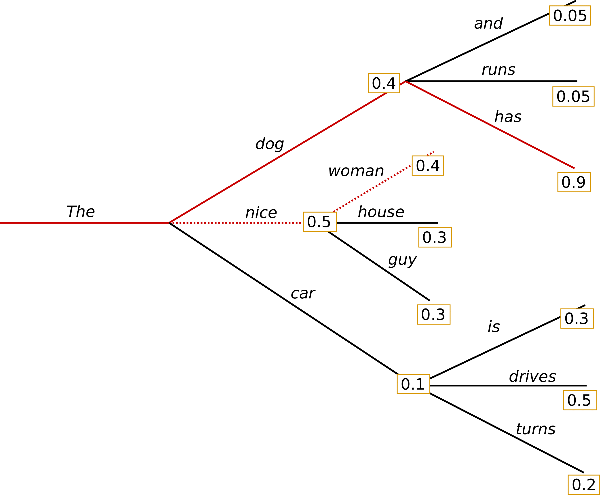

### Sampling: the next token is sampled from the probability distribution

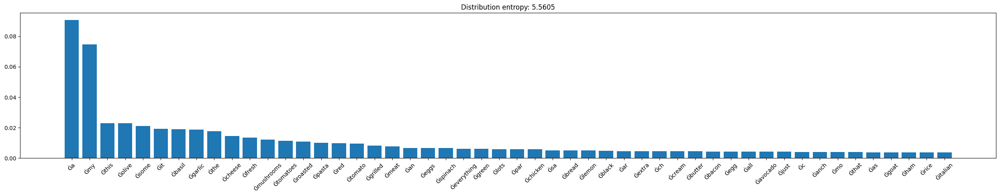

I like pesto with un


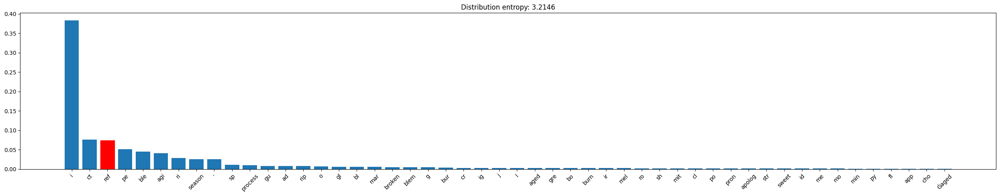

I like pesto with unref


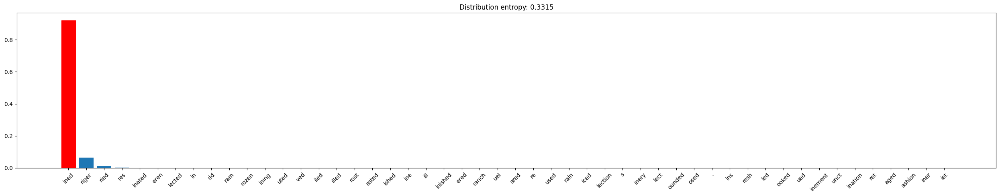

I like pesto with unrefined


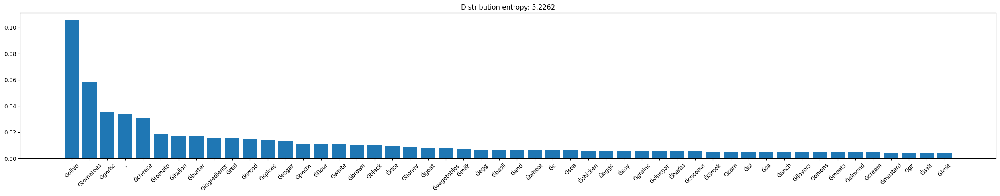

I like pesto with unrefined salad


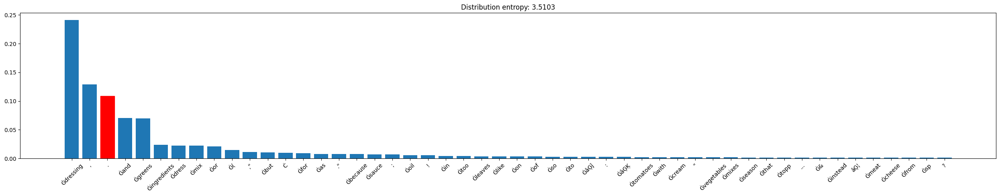

I like pesto with unrefined salad.


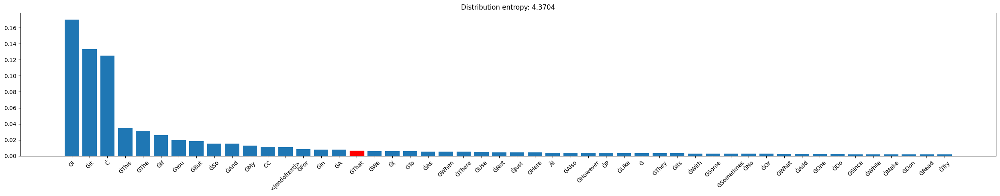

I like pesto with unrefined salad. That


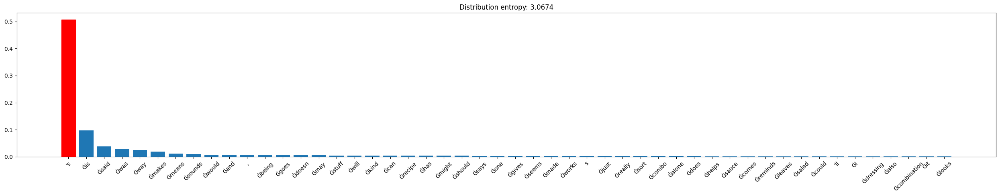

I like pesto with unrefined salad. That's


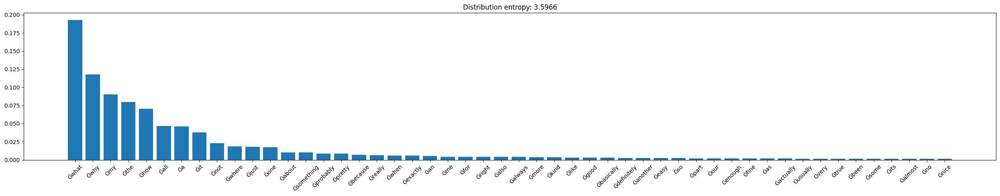

I like pesto with unrefined salad. That's better


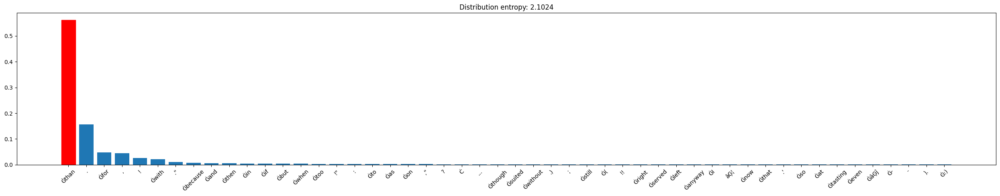

I like pesto with unrefined salad. That's better than


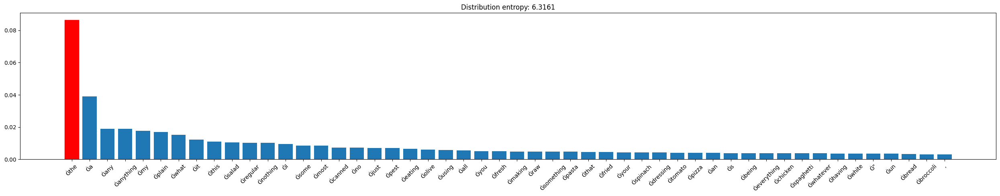

I like pesto with unrefined salad. That's better than the


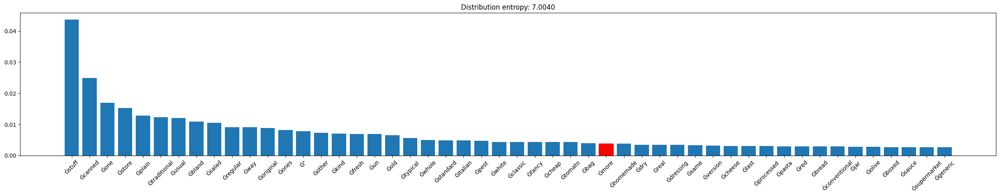

I like pesto with unrefined salad. That's better than the more


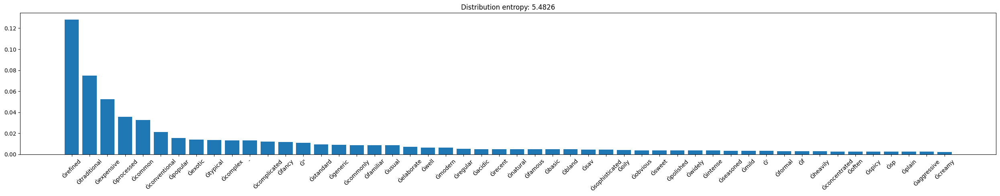

I like pesto with unrefined salad. That's better than the more boring


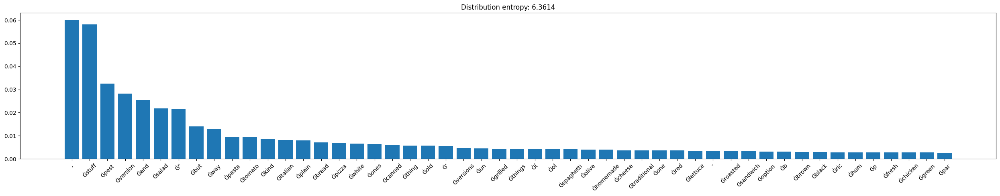

I like pesto with unrefined salad. That's better than the more boring jar


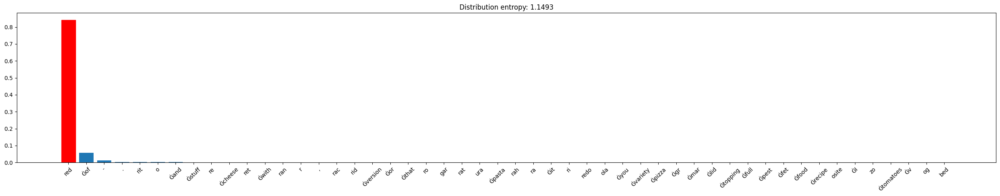

I like pesto with unrefined salad. That's better than the more boring jarred


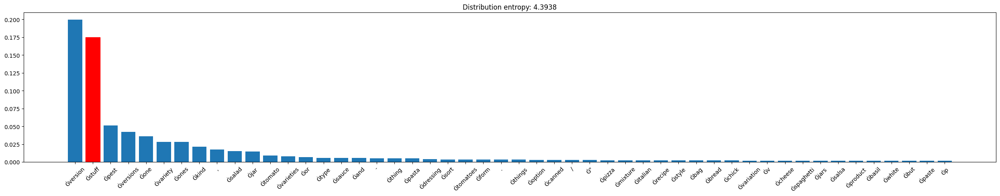

I like pesto with unrefined salad. That's better than the more boring jarred stuff


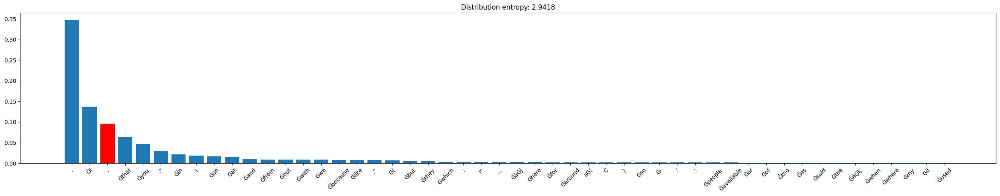

I like pesto with unrefined salad. That's better than the more boring jarred stuff,


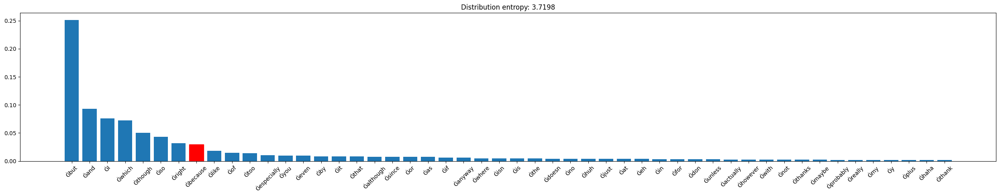

I like pesto with unrefined salad. That's better than the more boring jarred stuff, because


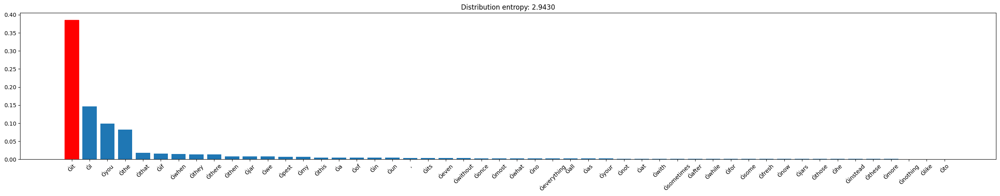

I like pesto with unrefined salad. That's better than the more boring jarred stuff, because it


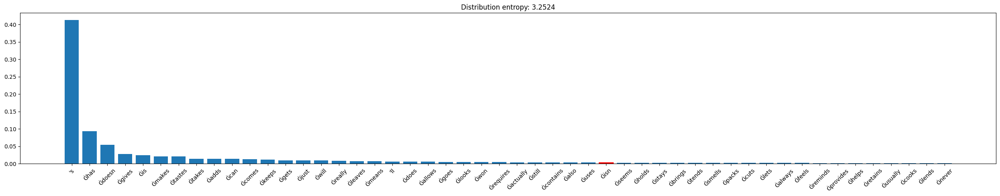

I like pesto with unrefined salad. That's better than the more boring jarred stuff, because it isn


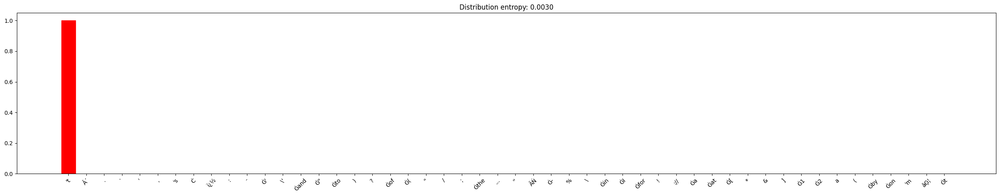

I like pesto with unrefined salad. That's better than the more boring jarred stuff, because it isn't


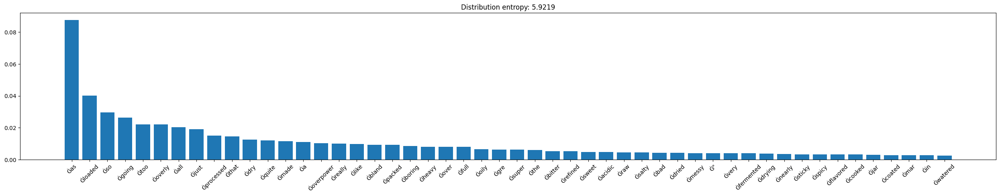

I like pesto with unrefined salad. That's better than the more boring jarred stuff, because it isn't sal


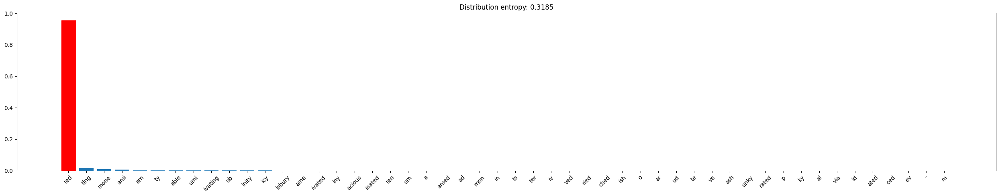

I like pesto with unrefined salad. That's better than the more boring jarred stuff, because it isn't salted


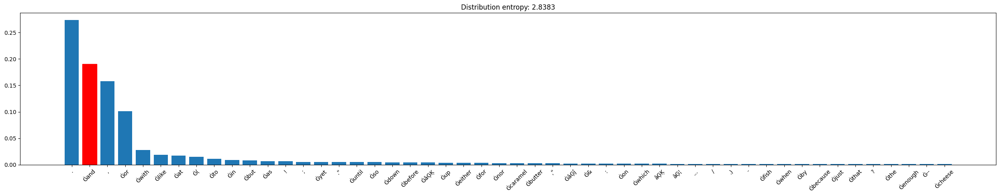

I like pesto with unrefined salad. That's better than the more boring jarred stuff, because it isn't salted and


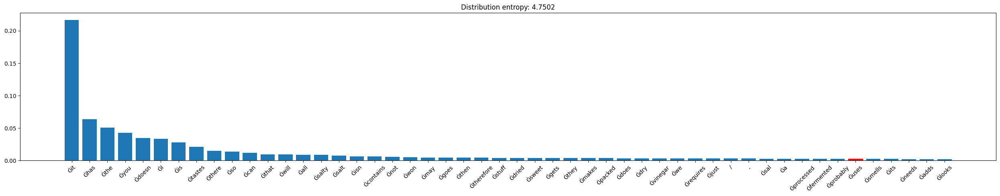

I like pesto with unrefined salad. That's better than the more boring jarred stuff, because it isn't salted and uses


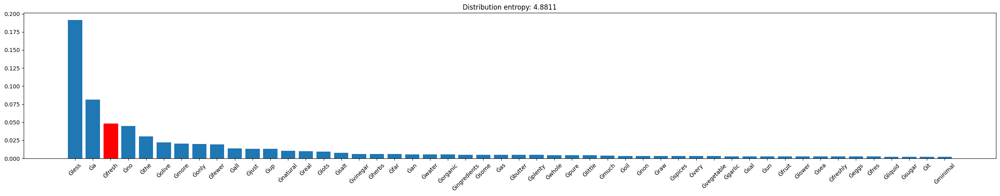

I like pesto with unrefined salad. That's better than the more boring jarred stuff, because it isn't salted and uses fresh


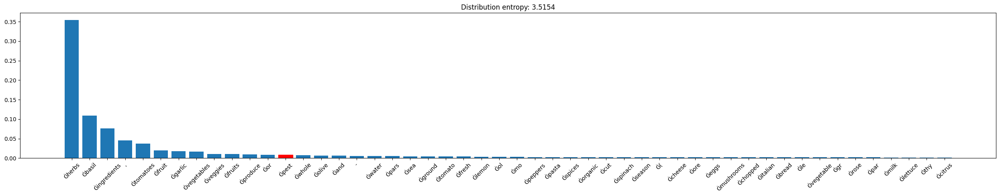

I like pesto with unrefined salad. That's better than the more boring jarred stuff, because it isn't salted and uses fresh pest


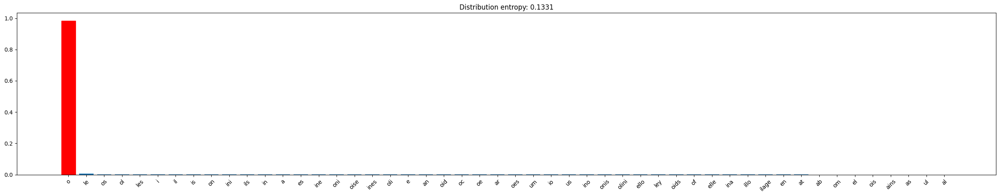

I like pesto with unrefined salad. That's better than the more boring jarred stuff, because it isn't salted and uses fresh pesto


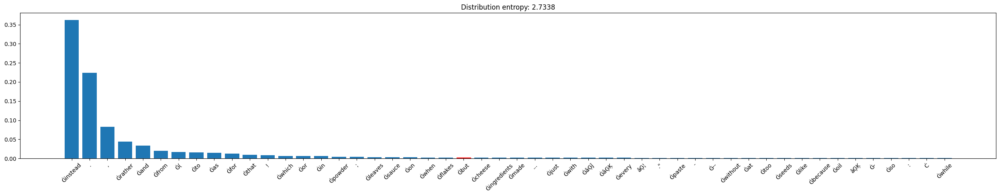

I like pesto with unrefined salad. That's better than the more boring jarred stuff, because it isn't salted and uses fresh pesto but


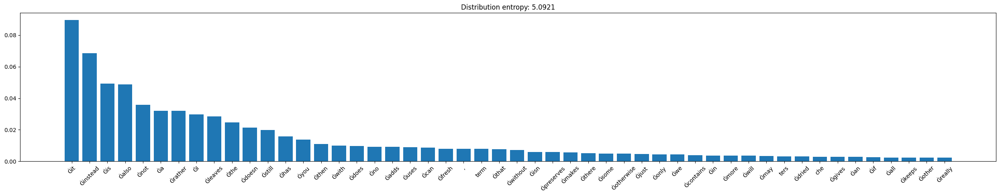

I like pesto with unrefined salad. That's better than the more boring jarred stuff, because it isn't salted and uses fresh pesto but sk


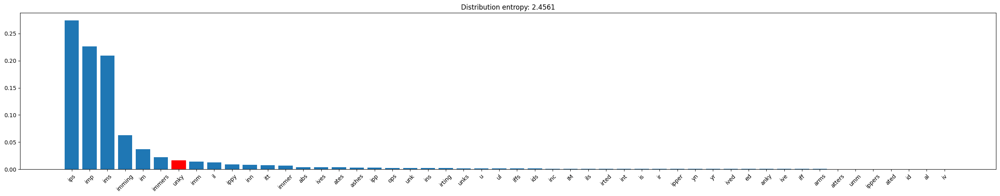

I like pesto with unrefined salad. That's better than the more boring jarred stuff, because it isn't salted and uses fresh pesto but skunky


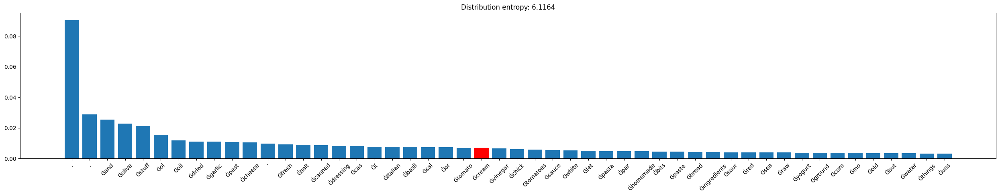

I like pesto with unrefined salad. That's better than the more boring jarred stuff, because it isn't salted and uses fresh pesto but skunky cream


In [13]:
def sampling_generate(input_text, logits, plot = False):
  probabilities = torch.nn.functional.softmax(logits, dim=-1) # transform logits into probabilities
  sampled_prob_token = torch.multinomial(probabilities, num_samples = 1).item()
  if plot:
    sorted_probabilities, sorted_ids = torch.sort(probabilities, descending = True)
    plot_logits(sorted_probabilities, sorted_ids, first_k=50, picked_token_id = sampled_prob_token, compute_entropy = True)
  return sampled_prob_token

output_text = input_text

i = 0

while i <= max_new_tokens:
  input_ids = tokenizer(output_text, return_tensors="pt").input_ids
  with torch.no_grad():
    logits = model(input_ids).logits
  next_tok_logits = logits[0, -1, :] # we take the next token logits (batch, tokens, logits)
  out_token = sampling_generate(output_text, next_tok_logits, plot = True)
  output_text += tokenizer.decode(out_token)
  print(output_text)
  i+=1

That is the big problem when sampling word sequences: The models often generate incoherent gibberish!

A trick is to make the distribution P(w∣w1:t−1)P(w∣w1:t−1​) sharper (increasing the likelihood of high probability words and decreasing the likelihood of low probability words) by lowering the so-called "temperature" of the softmax

For example:

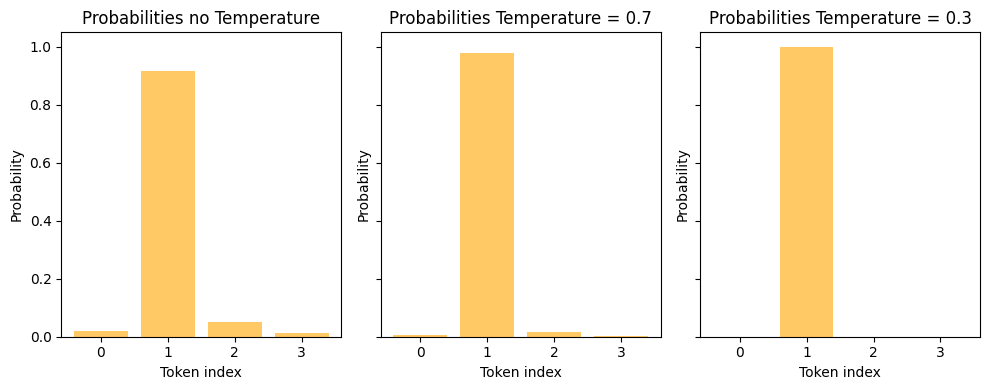

In [14]:
example_logits = torch.tensor([1.3, 5.1, 2.2, 0.7])
example_probs = torch.nn.functional.softmax(example_logits, dim=-1)

temperature = 0.7
example_probs_high_temp = torch.nn.functional.softmax(example_logits / temperature, dim=-1)

temperature = 0.3
example_probs_low_temp = torch.nn.functional.softmax(example_logits / temperature, dim=-1)

# visualize different temperatures

fig, axes = plt.subplots(1, 3, figsize=(10, 4), sharey = True)

axes[0].bar(range(len(example_probs)), example_probs, color='orange', alpha=0.6)
axes[0].set_title("Probabilities no Temperature")
axes[0].set_xlabel("Token index")
axes[0].set_ylabel("Probability")

axes[1].bar(range(len(example_probs_high_temp)), example_probs_high_temp, color='orange', alpha=0.6)
axes[1].set_title("Probabilities Temperature = 0.7")
axes[1].set_xlabel("Token index")
axes[1].set_ylabel("Probability")

axes[2].bar(range(len(example_probs_low_temp)), example_probs_low_temp, color='orange', alpha=0.6)
axes[2].set_title("Probabilities Temperature = 0.3")
axes[2].set_xlabel("Token index")
axes[2].set_ylabel("Probability")

plt.tight_layout()
plt.show()

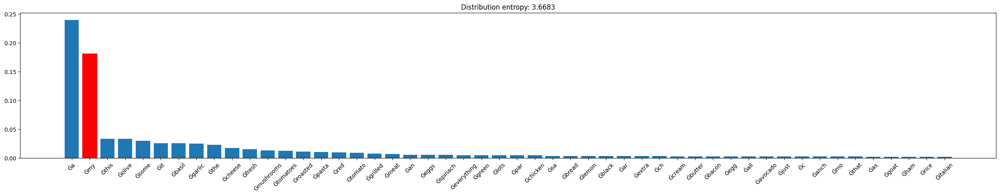

I like pesto with my


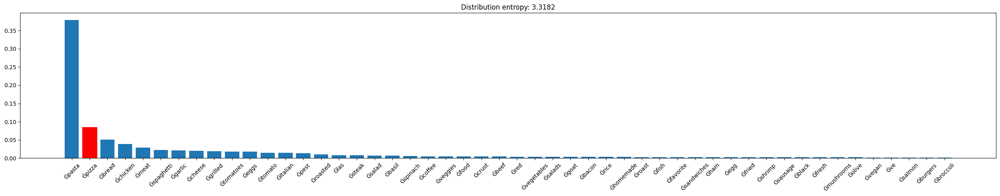

I like pesto with my pizza


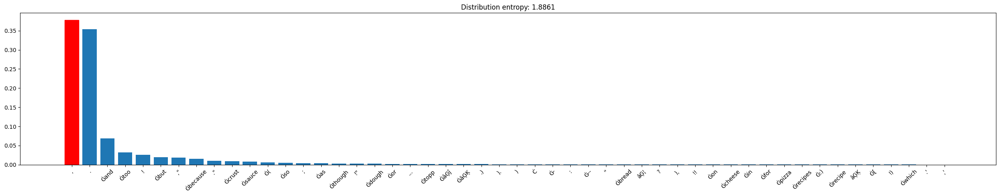

I like pesto with my pizza,


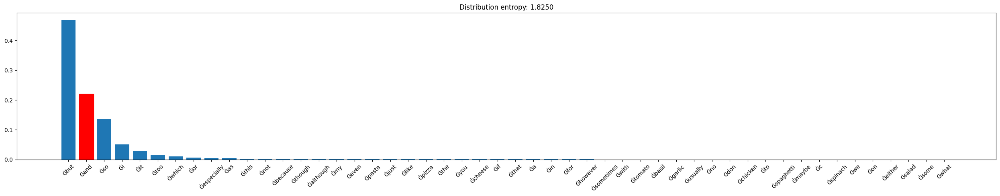

I like pesto with my pizza, and


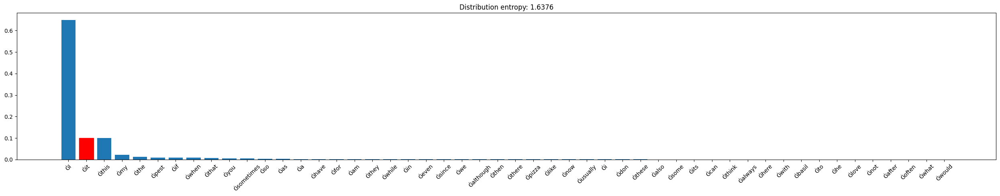

I like pesto with my pizza, and it


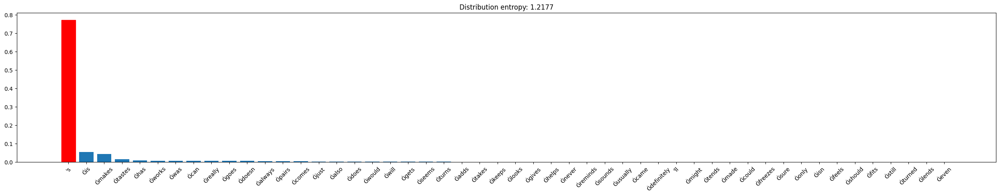

I like pesto with my pizza, and it's


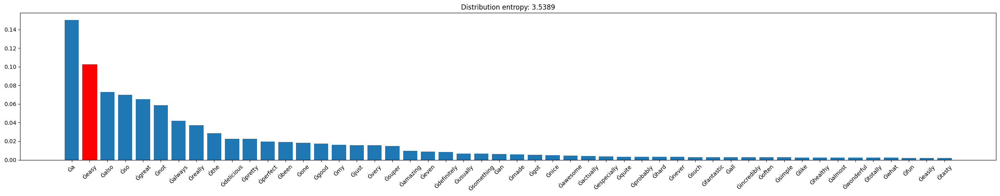

I like pesto with my pizza, and it's easy


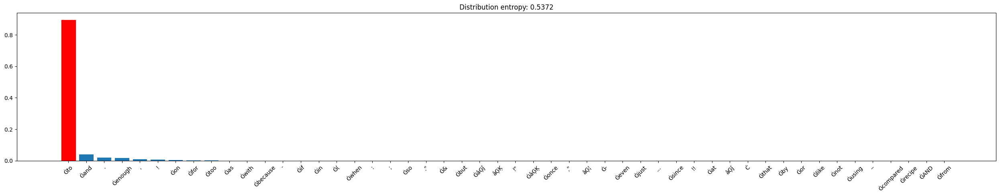

I like pesto with my pizza, and it's easy to


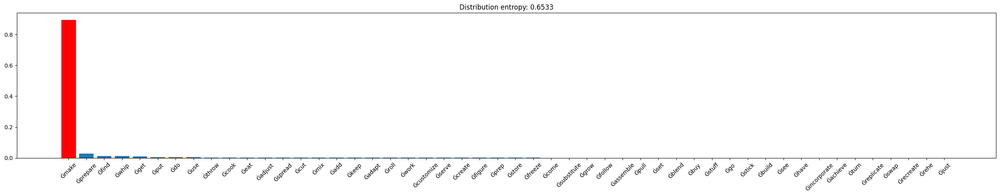

I like pesto with my pizza, and it's easy to make


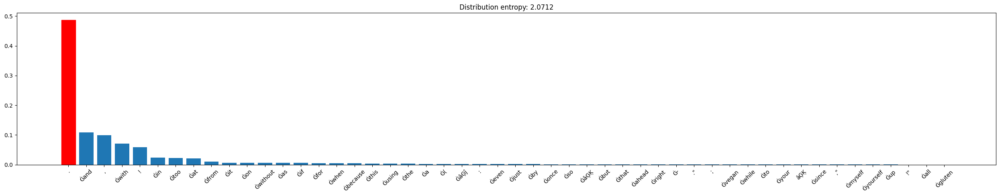

I like pesto with my pizza, and it's easy to make.


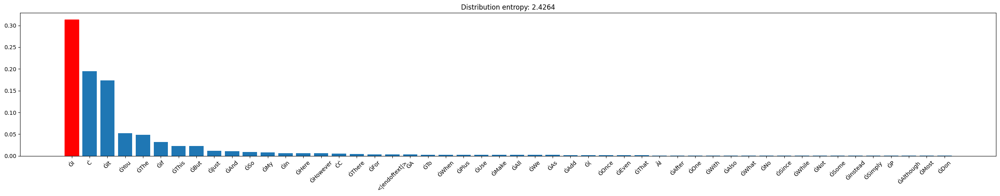

I like pesto with my pizza, and it's easy to make. I


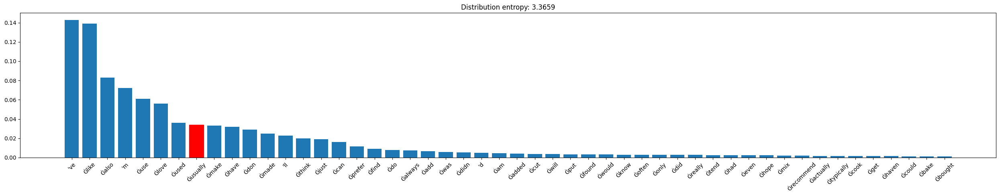

I like pesto with my pizza, and it's easy to make. I usually


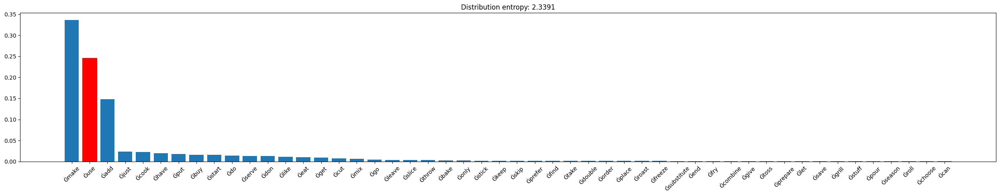

I like pesto with my pizza, and it's easy to make. I usually use


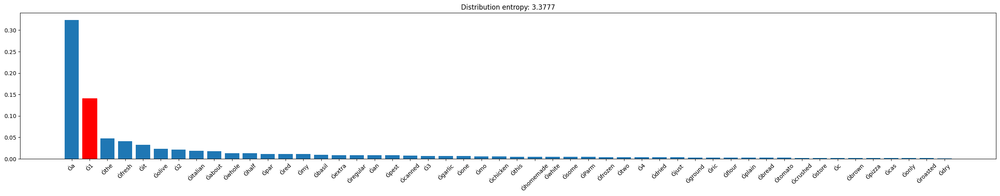

I like pesto with my pizza, and it's easy to make. I usually use 1


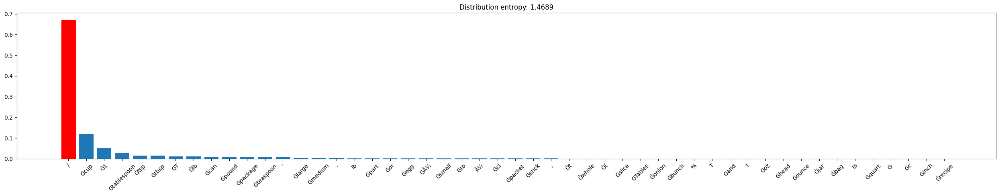

I like pesto with my pizza, and it's easy to make. I usually use 1/


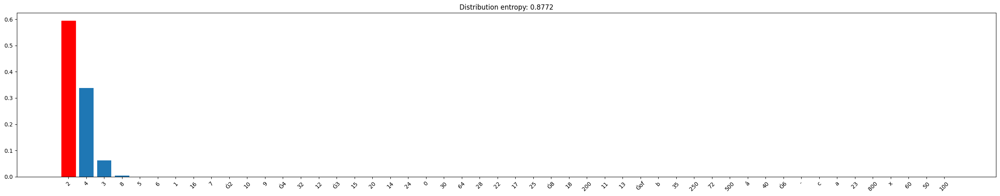

I like pesto with my pizza, and it's easy to make. I usually use 1/2


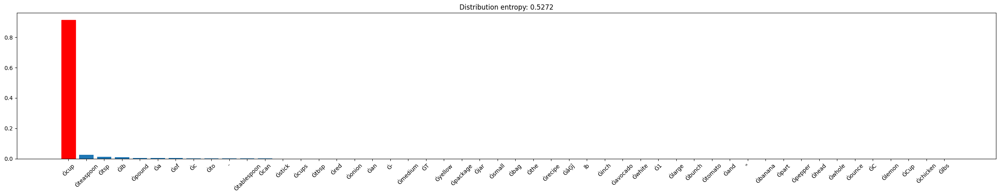

I like pesto with my pizza, and it's easy to make. I usually use 1/2 cup


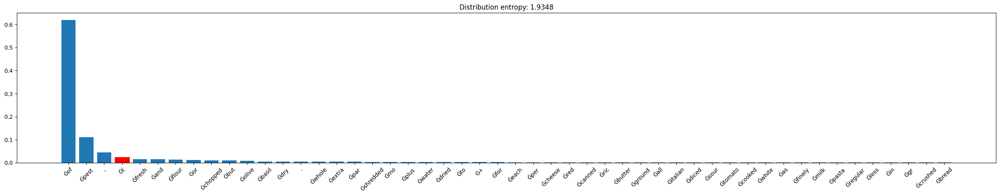

I like pesto with my pizza, and it's easy to make. I usually use 1/2 cup (


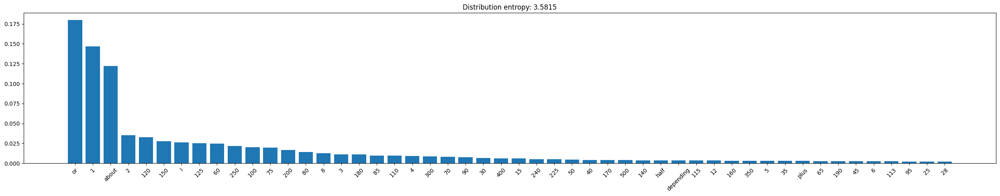

I like pesto with my pizza, and it's easy to make. I usually use 1/2 cup (not


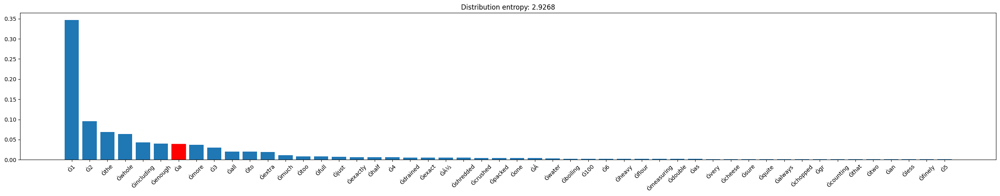

I like pesto with my pizza, and it's easy to make. I usually use 1/2 cup (not a


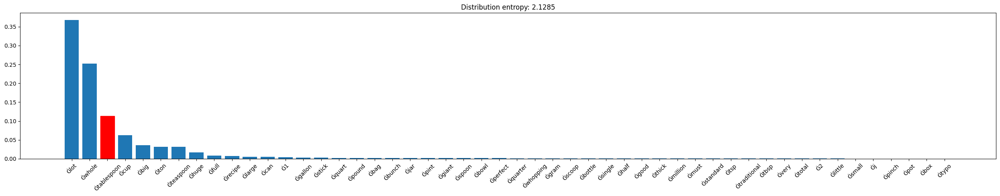

I like pesto with my pizza, and it's easy to make. I usually use 1/2 cup (not a tablespoon


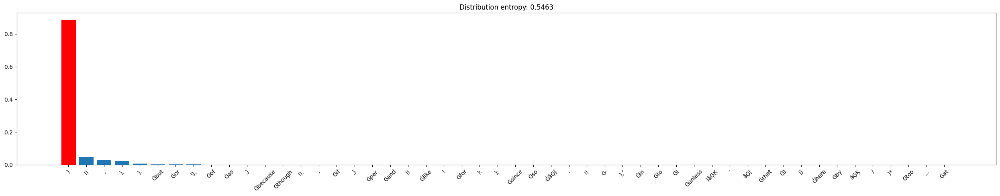

I like pesto with my pizza, and it's easy to make. I usually use 1/2 cup (not a tablespoon)


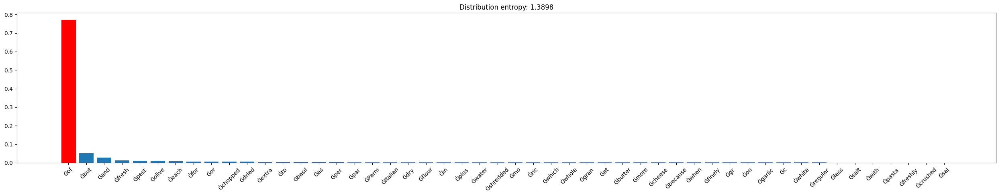

I like pesto with my pizza, and it's easy to make. I usually use 1/2 cup (not a tablespoon) of


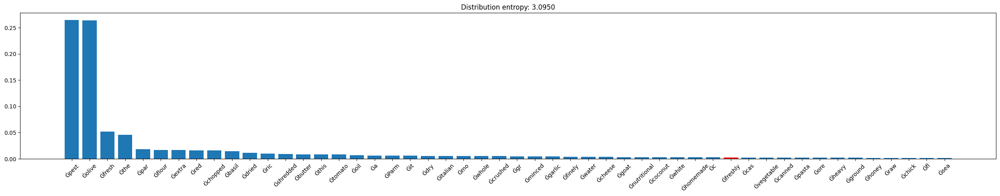

I like pesto with my pizza, and it's easy to make. I usually use 1/2 cup (not a tablespoon) of freshly


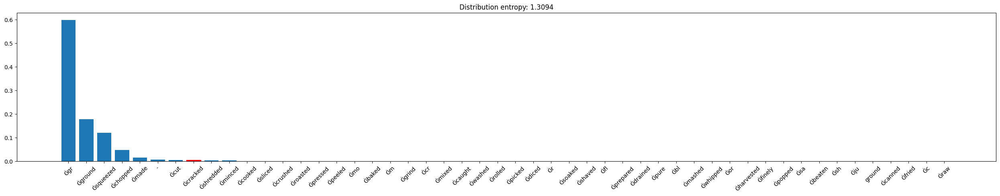

I like pesto with my pizza, and it's easy to make. I usually use 1/2 cup (not a tablespoon) of freshly cracked


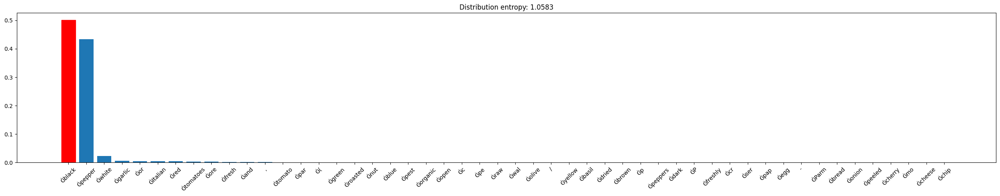

I like pesto with my pizza, and it's easy to make. I usually use 1/2 cup (not a tablespoon) of freshly cracked black


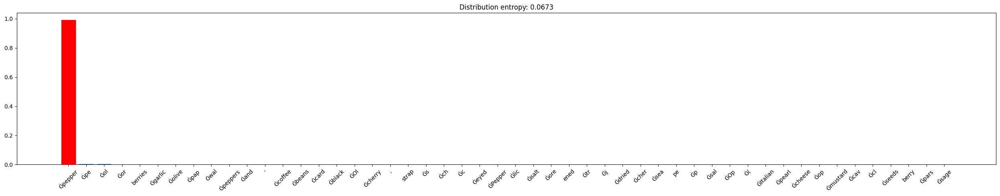

I like pesto with my pizza, and it's easy to make. I usually use 1/2 cup (not a tablespoon) of freshly cracked black pepper


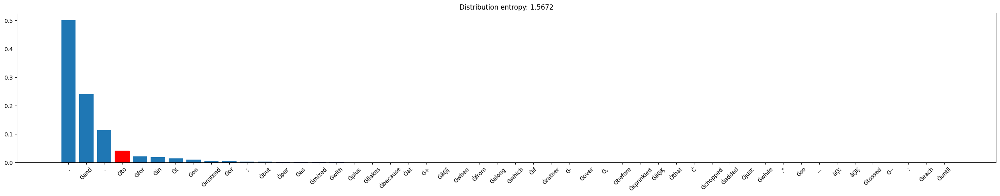

I like pesto with my pizza, and it's easy to make. I usually use 1/2 cup (not a tablespoon) of freshly cracked black pepper to


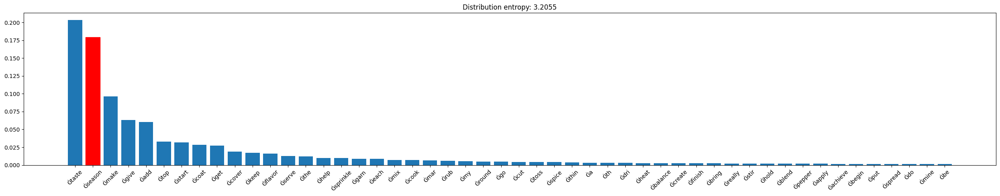

I like pesto with my pizza, and it's easy to make. I usually use 1/2 cup (not a tablespoon) of freshly cracked black pepper to season


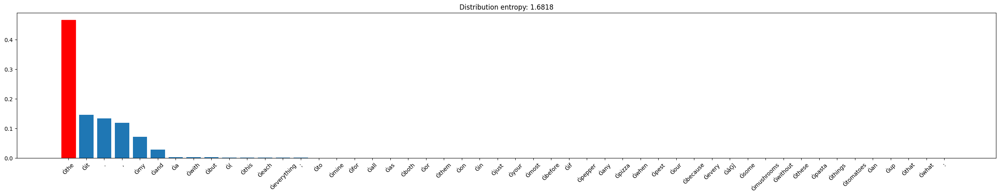

I like pesto with my pizza, and it's easy to make. I usually use 1/2 cup (not a tablespoon) of freshly cracked black pepper to season the


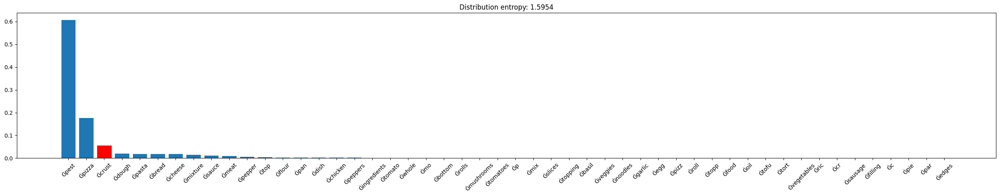

I like pesto with my pizza, and it's easy to make. I usually use 1/2 cup (not a tablespoon) of freshly cracked black pepper to season the crust


In [15]:
def sampling_generate(input_text, logits, temperature, plot = False):
  logits = logits / temperature  # Adjust temperature
  probabilities = torch.nn.functional.softmax(logits, dim=-1) # transform logits into probabilities
  sampled_prob_token = torch.multinomial(probabilities, num_samples = 1).item()
  if plot:
    sorted_probabilities, sorted_ids = torch.sort(probabilities, descending = True)
    plot_logits(sorted_probabilities, sorted_ids, first_k=50, picked_token_id = sampled_prob_token, compute_entropy = True)
  return sampled_prob_token

output_text = input_text

i = 0

while i <= max_new_tokens:
  input_ids = tokenizer(output_text, return_tensors="pt").input_ids
  with torch.no_grad():
    logits = model(input_ids).logits
  next_tok_logits = logits[0, -1, :] # we take the next token logits (batch, tokens, logits)
  out_token = sampling_generate(output_text, next_tok_logits, temperature = 0.7, plot = True)
  output_text += tokenizer.decode(out_token)
  print(output_text)
  i+=1


### Top-K sampling

Fan et. al (2018) introduced a simple, but very powerful sampling scheme, called Top-K sampling.

In Top-K sampling, the K most likely next words are filtered and the probability mass is redistributed among only those K next words.

GPT2 adopted this sampling scheme, which was one of the reasons for its success in story generation.

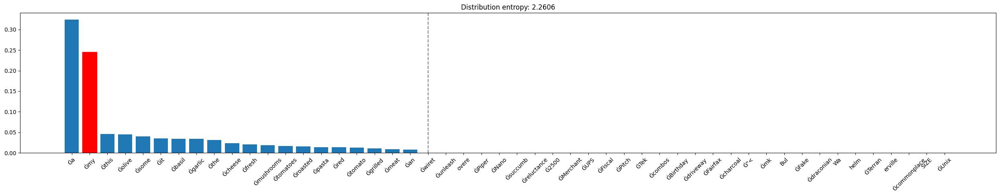

I like pesto with my


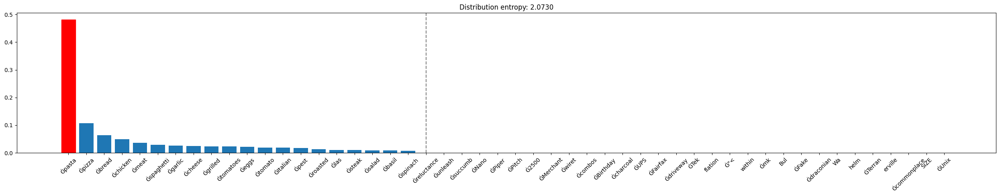

I like pesto with my pasta


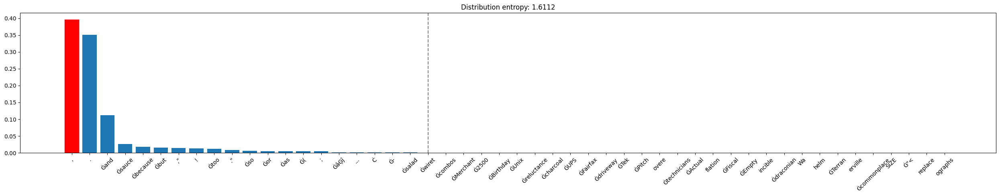

I like pesto with my pasta,


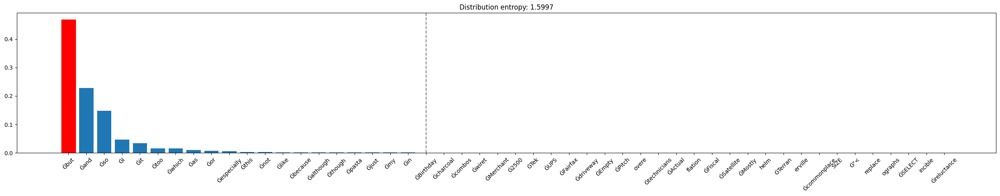

I like pesto with my pasta, but


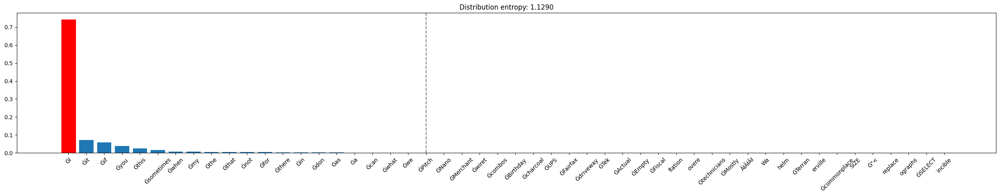

I like pesto with my pasta, but I


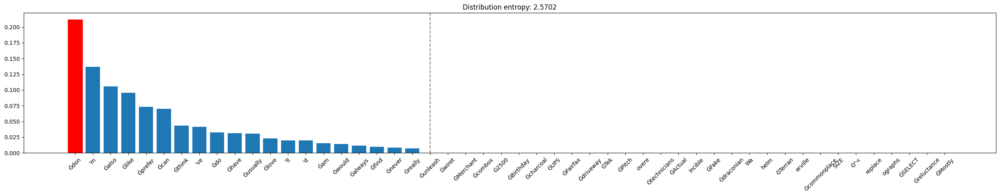

I like pesto with my pasta, but I don


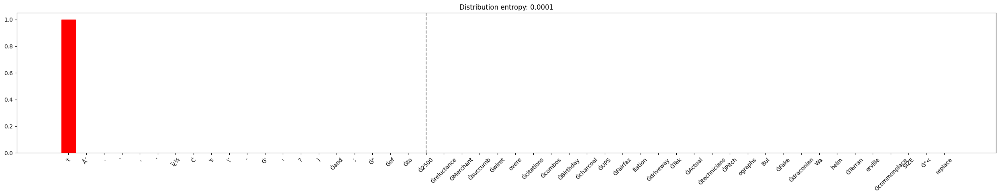

I like pesto with my pasta, but I don't


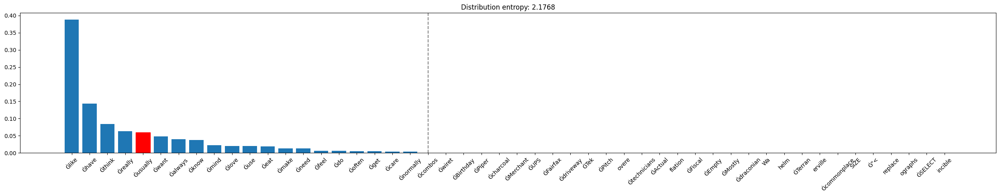

I like pesto with my pasta, but I don't usually


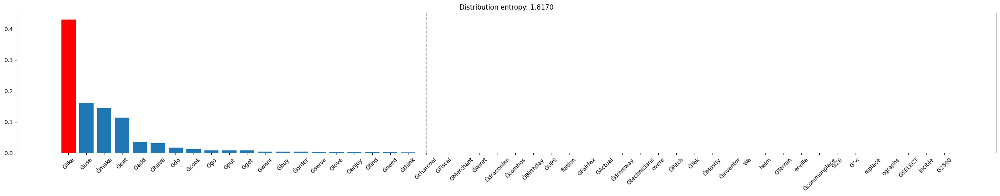

I like pesto with my pasta, but I don't usually like


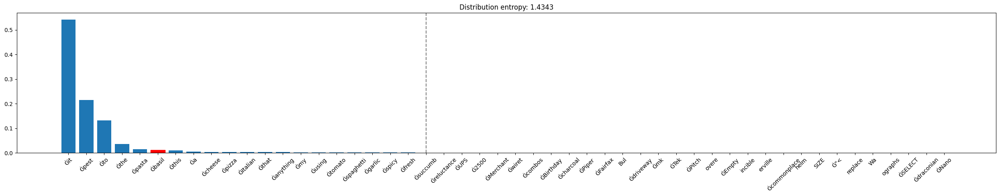

I like pesto with my pasta, but I don't usually like basil


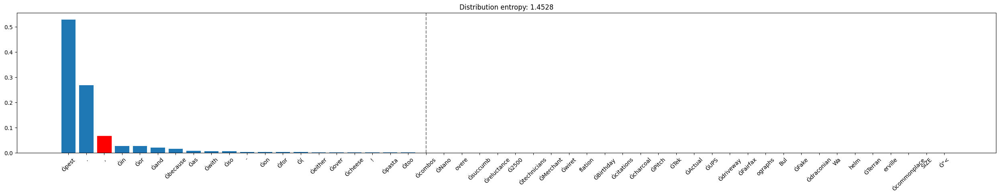

I like pesto with my pasta, but I don't usually like basil,


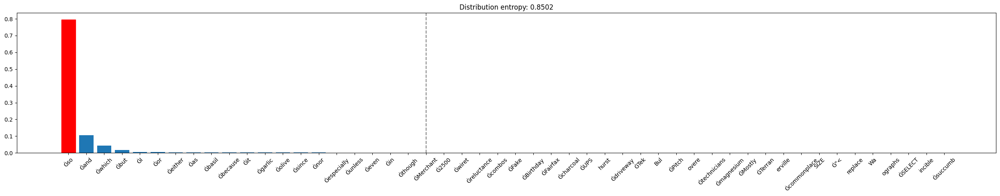

I like pesto with my pasta, but I don't usually like basil, so


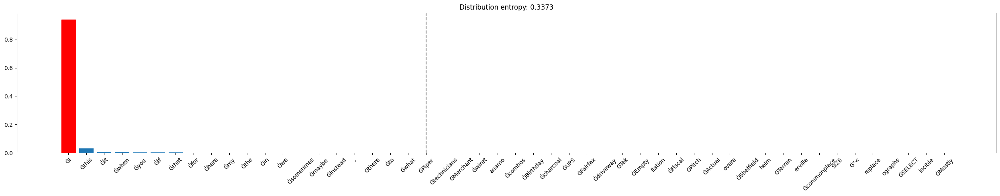

I like pesto with my pasta, but I don't usually like basil, so I


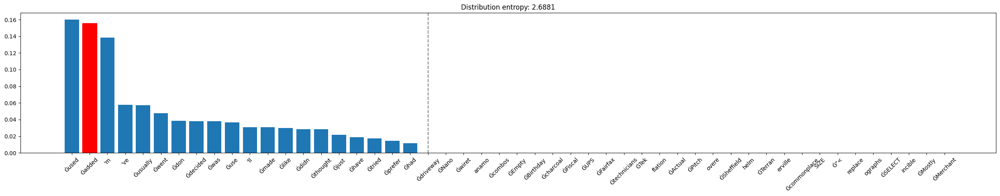

I like pesto with my pasta, but I don't usually like basil, so I added


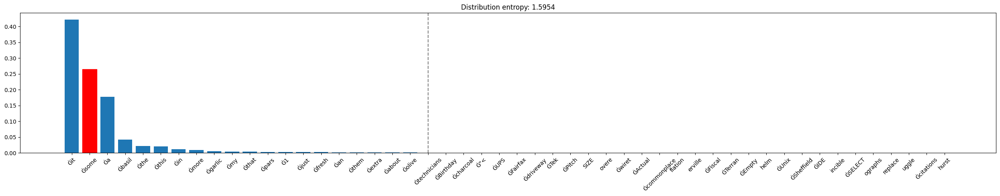

I like pesto with my pasta, but I don't usually like basil, so I added some


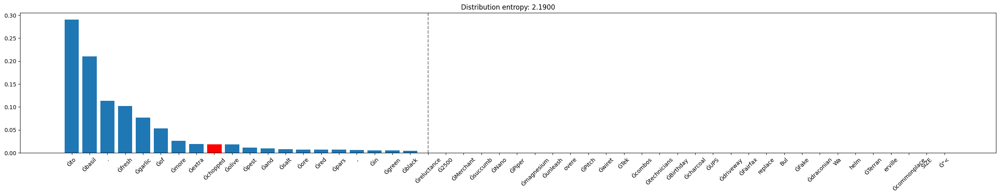

I like pesto with my pasta, but I don't usually like basil, so I added some chopped


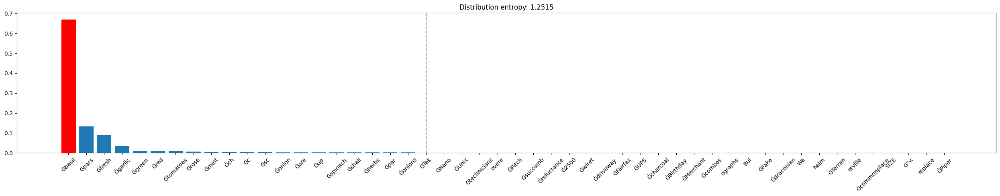

I like pesto with my pasta, but I don't usually like basil, so I added some chopped basil


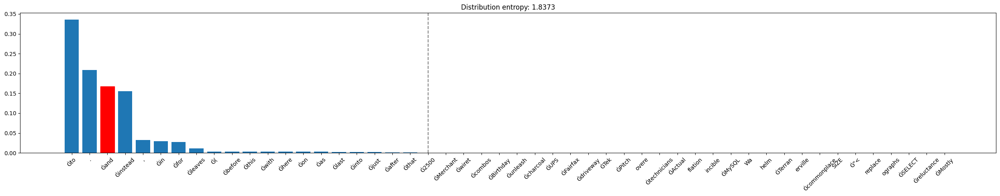

I like pesto with my pasta, but I don't usually like basil, so I added some chopped basil and


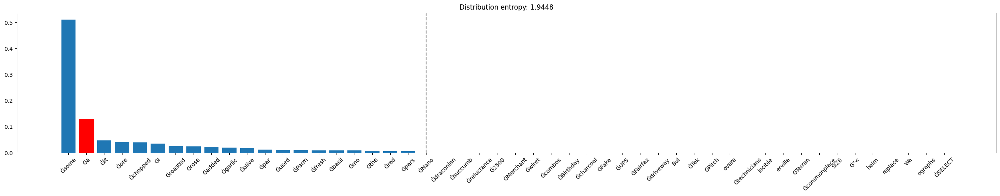

I like pesto with my pasta, but I don't usually like basil, so I added some chopped basil and a


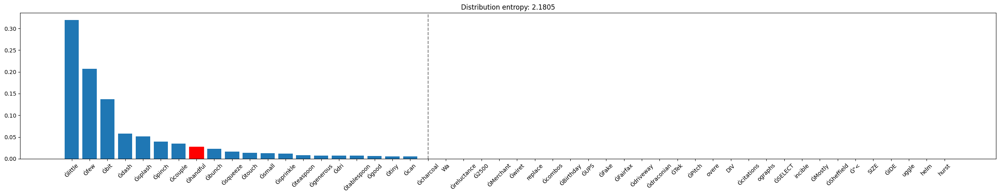

I like pesto with my pasta, but I don't usually like basil, so I added some chopped basil and a handful


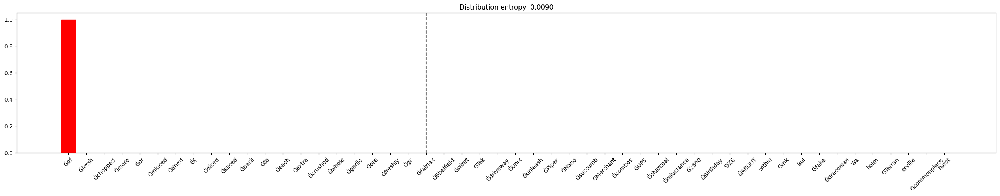

I like pesto with my pasta, but I don't usually like basil, so I added some chopped basil and a handful of


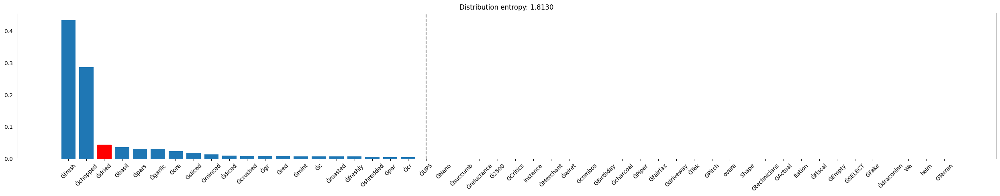

I like pesto with my pasta, but I don't usually like basil, so I added some chopped basil and a handful of dried


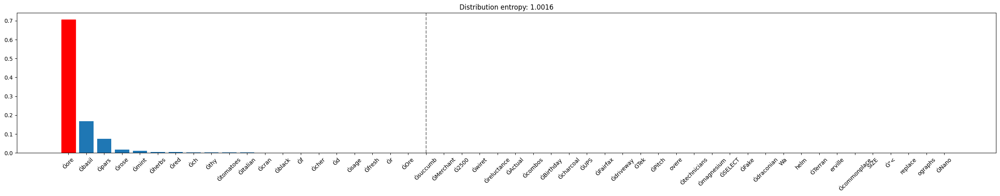

I like pesto with my pasta, but I don't usually like basil, so I added some chopped basil and a handful of dried ore


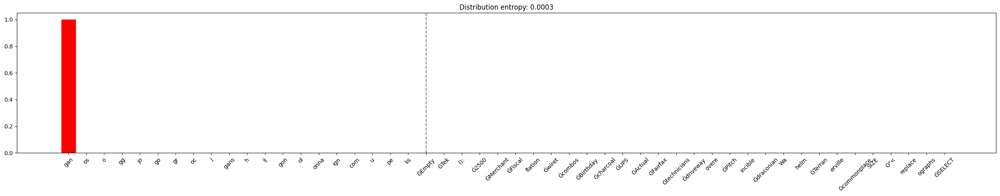

I like pesto with my pasta, but I don't usually like basil, so I added some chopped basil and a handful of dried oregan


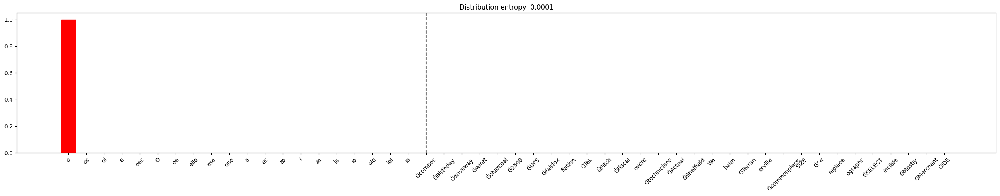

I like pesto with my pasta, but I don't usually like basil, so I added some chopped basil and a handful of dried oregano


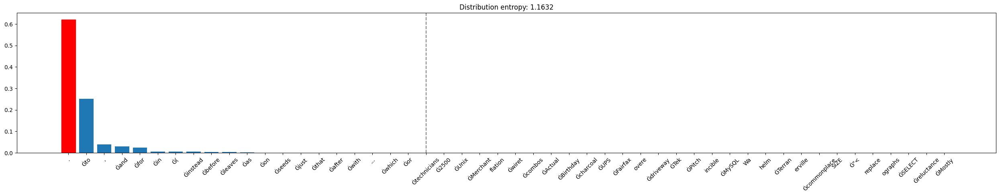

I like pesto with my pasta, but I don't usually like basil, so I added some chopped basil and a handful of dried oregano.


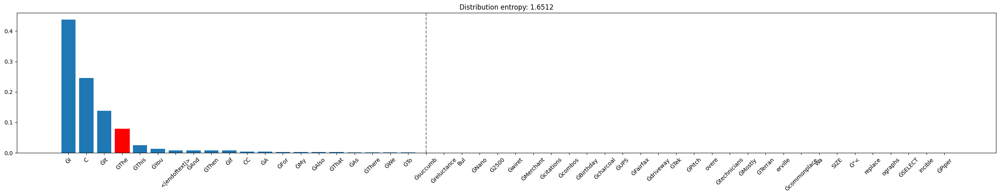

I like pesto with my pasta, but I don't usually like basil, so I added some chopped basil and a handful of dried oregano. The


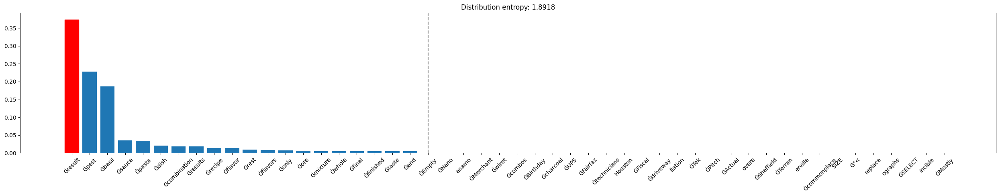

I like pesto with my pasta, but I don't usually like basil, so I added some chopped basil and a handful of dried oregano. The result


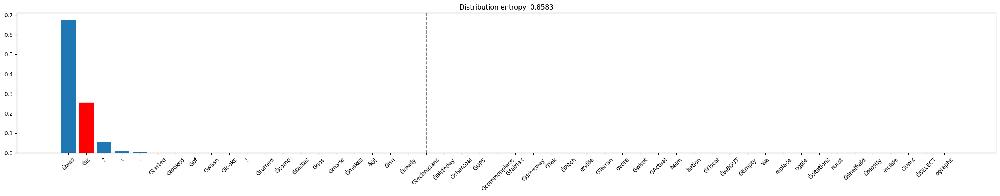

I like pesto with my pasta, but I don't usually like basil, so I added some chopped basil and a handful of dried oregano. The result is


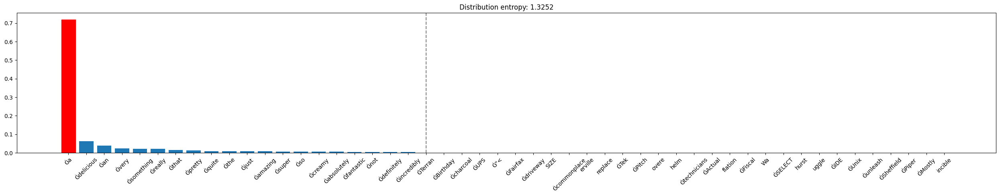

I like pesto with my pasta, but I don't usually like basil, so I added some chopped basil and a handful of dried oregano. The result is a


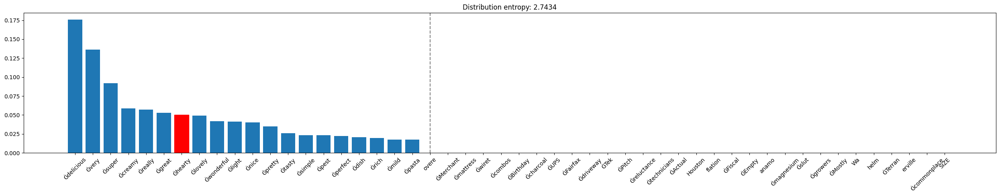

I like pesto with my pasta, but I don't usually like basil, so I added some chopped basil and a handful of dried oregano. The result is a hearty


In [16]:
def sampling_generate(input_text, logits, temperature = None, top_k = None, plot = False):
  logits = logits / temperature  # Adjust temperature
  logits = logits.squeeze()
  topk_logits, topk_indices = torch.topk(logits, k = top_k) # take the first k tokens
  topk_logits, topk_indices = topk_logits.squeeze(), topk_indices.squeeze()
  indices_to_remove = logits < topk_logits[-1] # we filter out the tokens that have a logit lower than the lowest logit in the topk
  indices_to_remove = indices_to_remove.nonzero()
  logits[indices_to_remove] = float('-inf')
  probabilities = torch.nn.functional.softmax(logits, dim=-1) # transform only topk logits into probabilities
  sampled_token = torch.multinomial(probabilities, num_samples = 1).item() # we sample from this new distribution
  if plot:
    sorted_probabilities, sorted_ids = torch.sort(probabilities, descending = True)
    plot_logits(sorted_probabilities, sorted_ids, first_k=50, picked_token_id = sampled_token, compute_entropy = True, vline = top_k)
  return sampled_token

output_text = input_text

i = 0

while i <= max_new_tokens:
  input_ids = tokenizer(output_text, return_tensors="pt").input_ids
  with torch.no_grad():
    logits = model(input_ids).logits
  next_tok_logits = logits[0, -1, :] # we take the next token logits (batch, tokens, logits)
  out_token = sampling_generate(output_text, next_tok_logits, temperature = 0.7, top_k = 20, plot = True)
  output_text += tokenizer.decode(out_token)
  print(output_text)
  i+=1

### Nucleus sampling (Top-N)
Instead of sampling only from the most likely K words, in Top-p sampling chooses from the smallest possible set of words whose cumulative probability exceeds the probability p. The probability mass is then redistributed among this set of words. This way, the size of the set of words (a.k.a the number of words in the set) can dynamically increase and decrease according to the next word's probability distribution

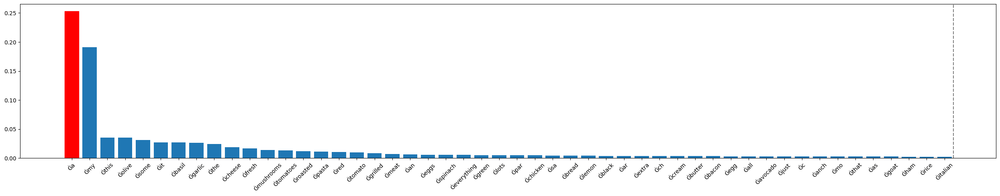

I like pesto with a


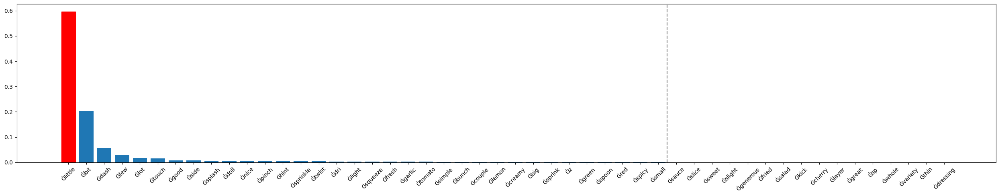

I like pesto with a little


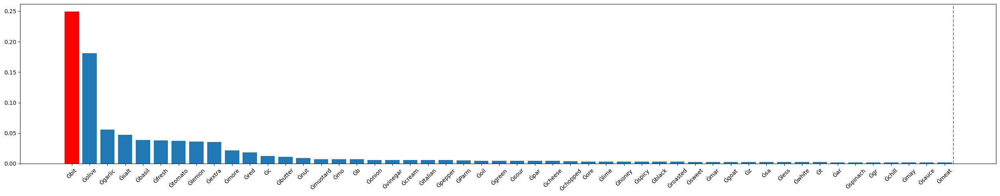

I like pesto with a little bit


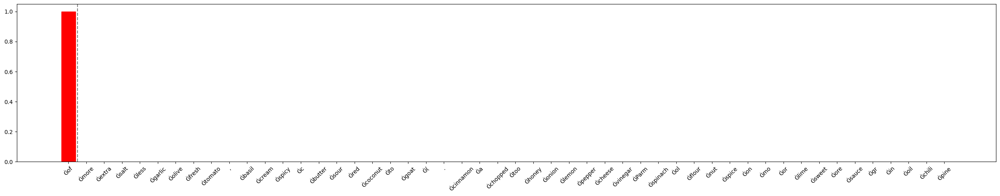

I like pesto with a little bit of


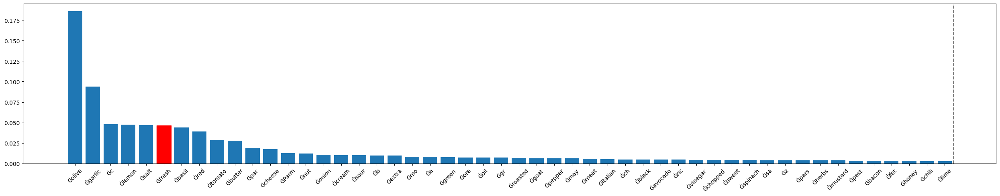

I like pesto with a little bit of fresh


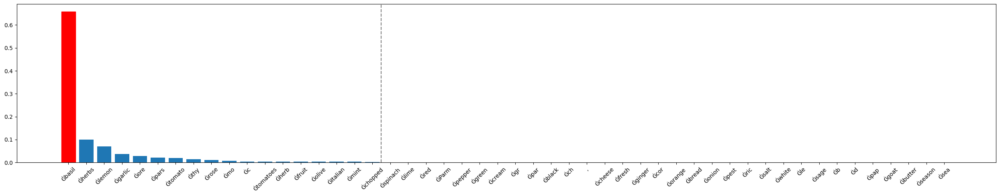

I like pesto with a little bit of fresh basil


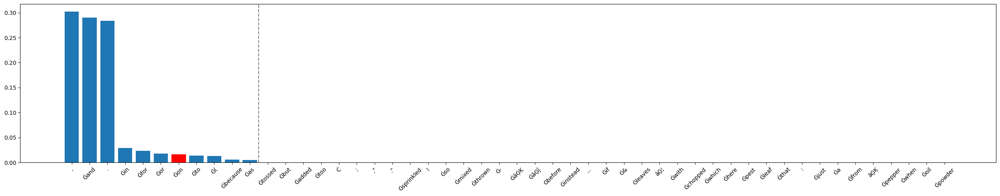

I like pesto with a little bit of fresh basil on


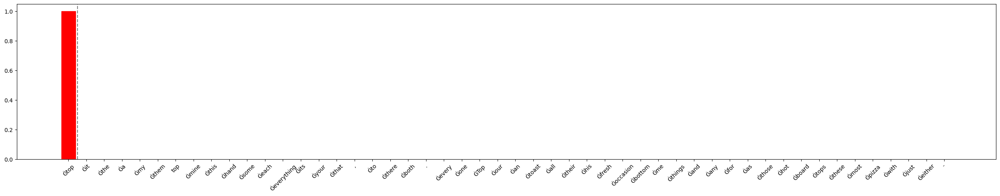

I like pesto with a little bit of fresh basil on top


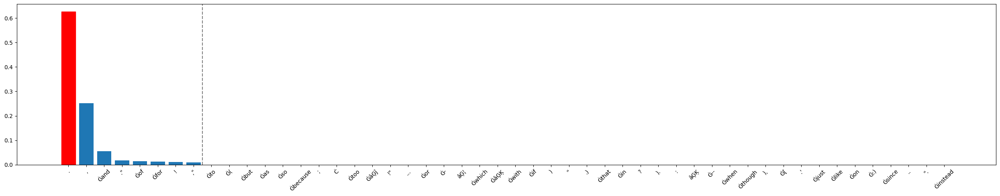

I like pesto with a little bit of fresh basil on top.


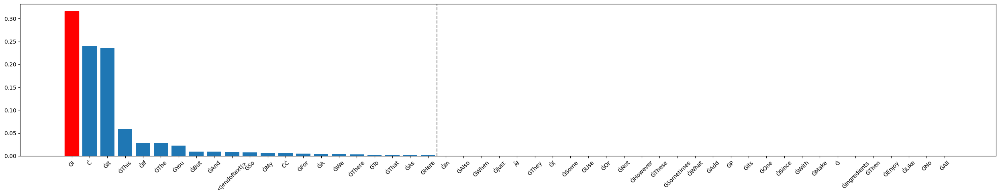

I like pesto with a little bit of fresh basil on top. I


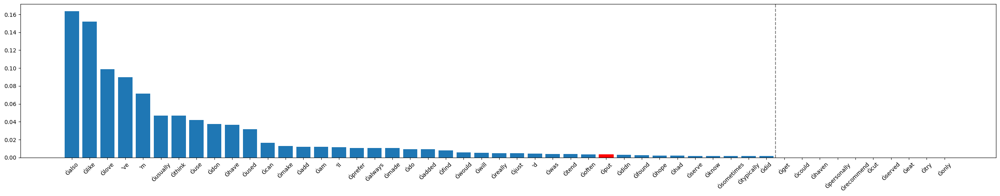

I like pesto with a little bit of fresh basil on top. I put


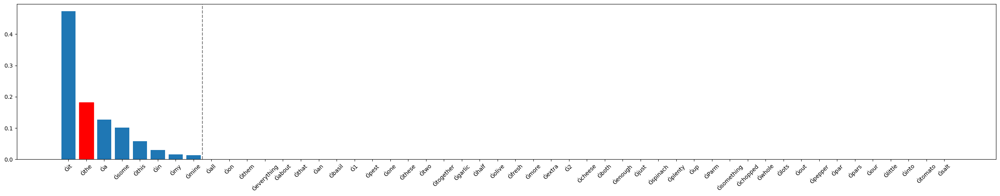

I like pesto with a little bit of fresh basil on top. I put the


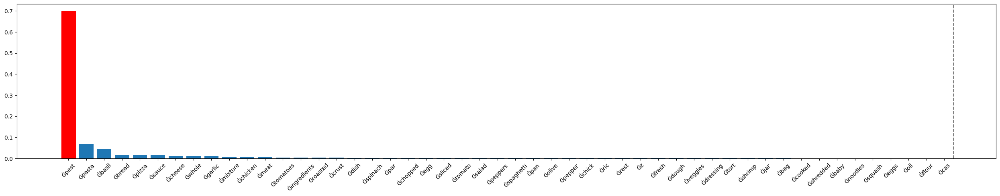

I like pesto with a little bit of fresh basil on top. I put the pest


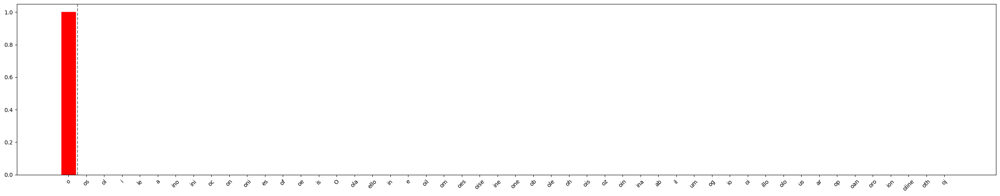

I like pesto with a little bit of fresh basil on top. I put the pesto


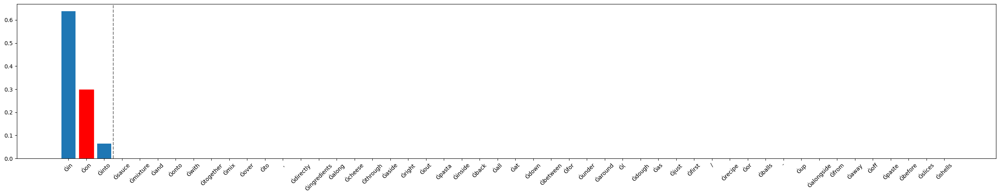

I like pesto with a little bit of fresh basil on top. I put the pesto on


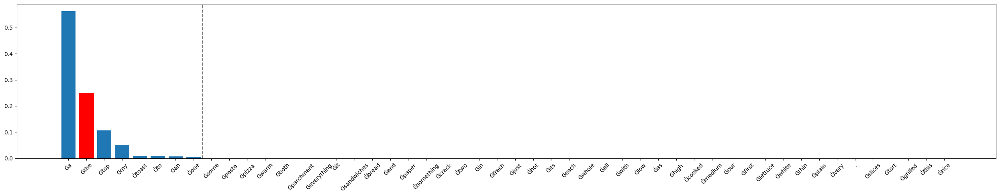

I like pesto with a little bit of fresh basil on top. I put the pesto on the


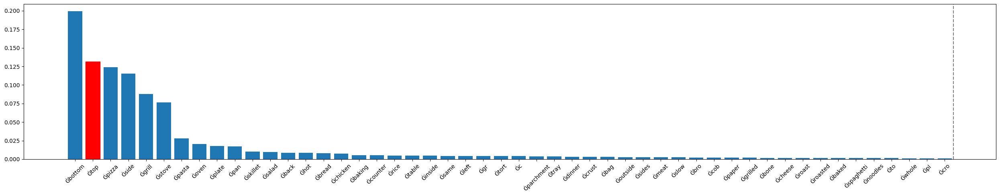

I like pesto with a little bit of fresh basil on top. I put the pesto on the top


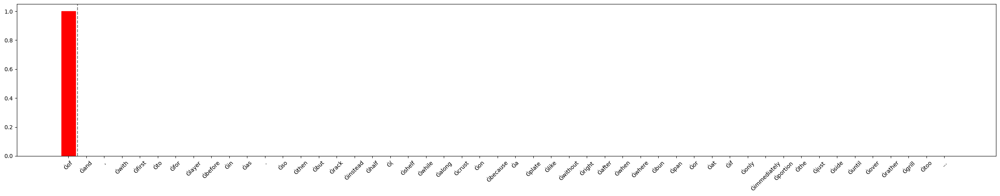

I like pesto with a little bit of fresh basil on top. I put the pesto on the top of


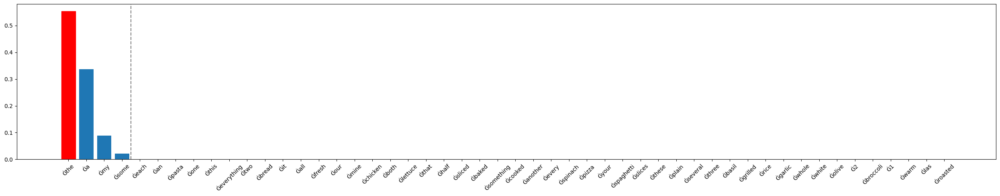

I like pesto with a little bit of fresh basil on top. I put the pesto on the top of the


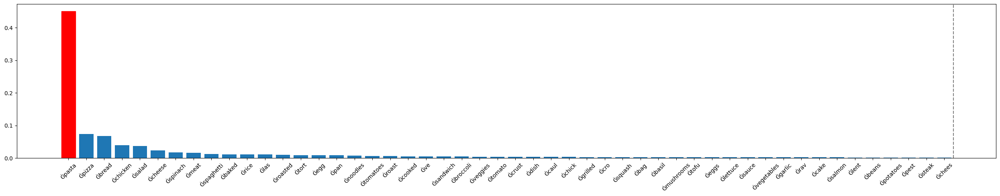

I like pesto with a little bit of fresh basil on top. I put the pesto on the top of the pasta


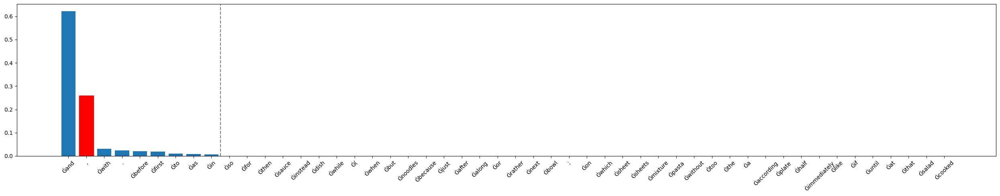

I like pesto with a little bit of fresh basil on top. I put the pesto on the top of the pasta,


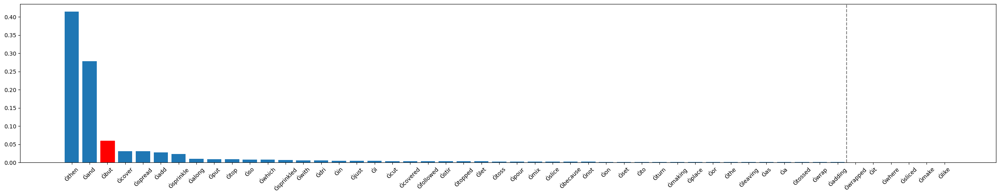

I like pesto with a little bit of fresh basil on top. I put the pesto on the top of the pasta, but


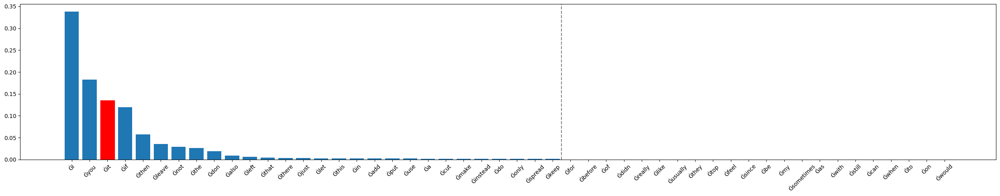

I like pesto with a little bit of fresh basil on top. I put the pesto on the top of the pasta, but it


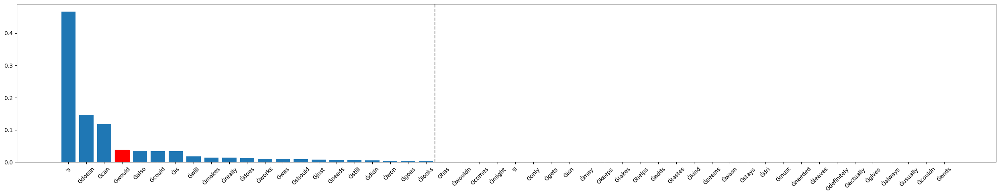

I like pesto with a little bit of fresh basil on top. I put the pesto on the top of the pasta, but it would


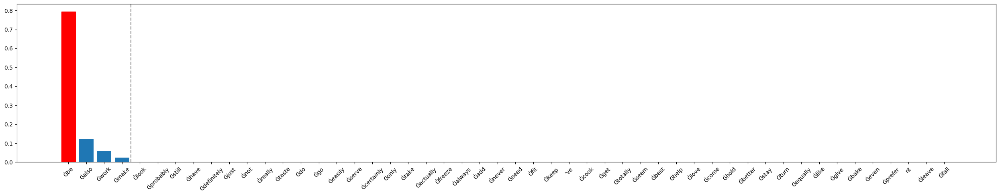

I like pesto with a little bit of fresh basil on top. I put the pesto on the top of the pasta, but it would be


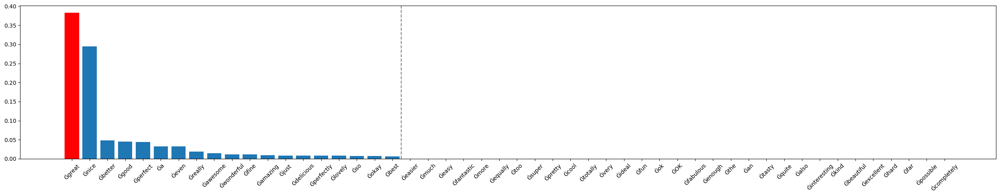

I like pesto with a little bit of fresh basil on top. I put the pesto on the top of the pasta, but it would be great


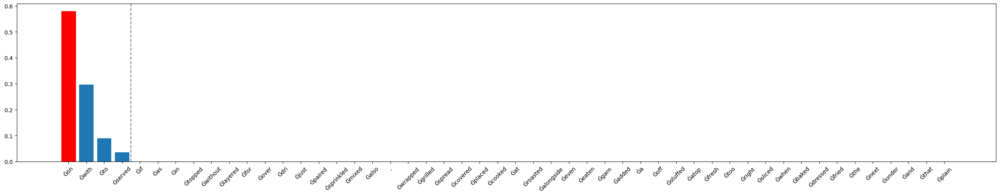

I like pesto with a little bit of fresh basil on top. I put the pesto on the top of the pasta, but it would be great on


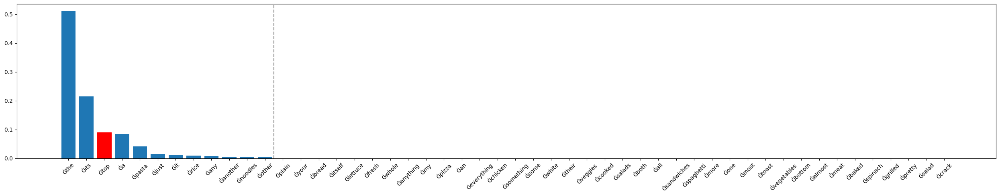

I like pesto with a little bit of fresh basil on top. I put the pesto on the top of the pasta, but it would be great on top


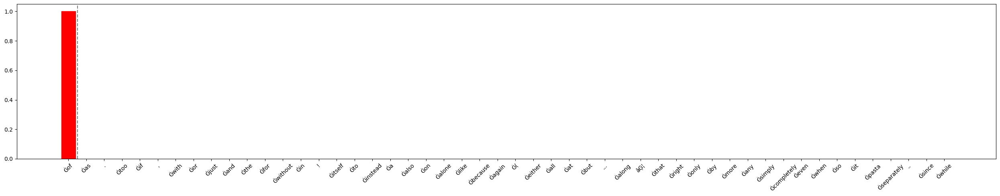

I like pesto with a little bit of fresh basil on top. I put the pesto on the top of the pasta, but it would be great on top of


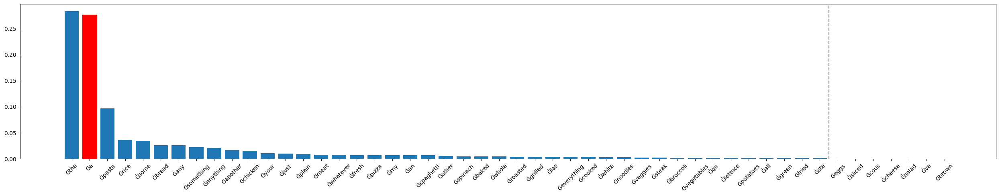

I like pesto with a little bit of fresh basil on top. I put the pesto on the top of the pasta, but it would be great on top of a


In [17]:
def sampling_generate(logits, temperature=1.0, top_p=0.9, plot=False):
    sorted_logits, sorted_indices = torch.sort(logits, descending=True)
    sorted_logits = sorted_logits / temperature
    sorted_probs = torch.softmax(sorted_logits, dim=-1)
    cumulative_probs = torch.cumsum(sorted_probs, dim=-1)
    nucleus_mask = cumulative_probs > top_p
    nucleus_mask[0] = False # we must always keep at least the first token
    indices_to_remove = nucleus_mask.nonzero()
    sorted_logits[indices_to_remove] = float("-inf")
    final_probs = torch.softmax(sorted_logits, dim=-1)
    sampled_pos = torch.multinomial(final_probs, num_samples=1).item()
    sampled_token_id = sorted_indices[sampled_pos].item()

    if plot:
        n_active_tokens = torch.sum(nucleus_mask == False).item()
        if n_active_tokens > 50:
          n_active_tokens = 50
        plot_logits(
            probs=final_probs,
            token_ids=sorted_indices,
            picked_token_id=sampled_token_id,
            first_k=50,
            vline=n_active_tokens - 0.5,
            compute_entropy=False
        )

    return sampled_token_id


output_text = input_text

for _ in range(max_new_tokens):
    input_ids = tokenizer(output_text, return_tensors="pt").input_ids
    with torch.no_grad():
        logits = model(input_ids).logits
    next_logits = logits[0, -1, :]   # shape [vocab_size]

    tok_id = sampling_generate(
        next_logits,
        top_p=0.95,
        temperature=0.7,
        plot=True
    )

    output_text += tokenizer.decode([tok_id])
    print(output_text)

#  It can be seen that it keeps a wide range of words where the next word is arguably less predictable
# and only a few words when the next word seems more predictable

### Repetition penalty
To avoid repetitions we can penalize already generated tokens by discounting their logits with a penalty

tensor([ -92.6668,  -94.0442, -101.0335,  ..., -103.8911,  -99.0834,
         -94.6066])


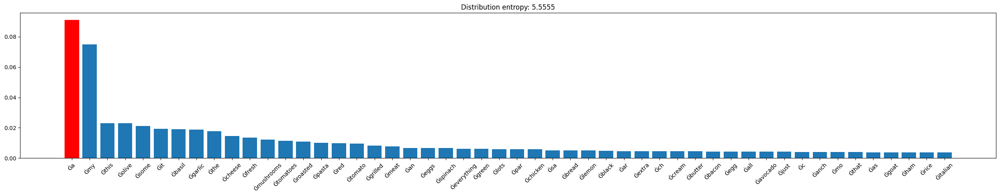

I like pesto with a
tensor([-100.0378, -100.5861, -104.4439,  ..., -110.0308, -105.3091,
        -102.1280])


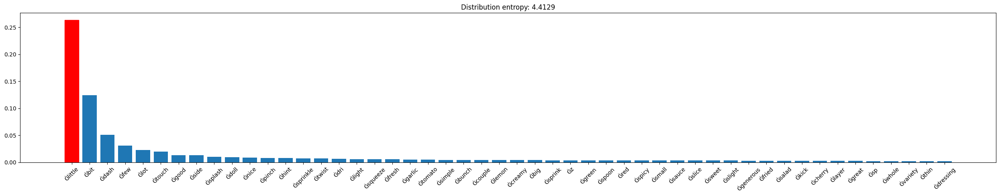

I like pesto with a little
tensor([-101.7505, -103.8703, -110.7366,  ..., -113.9814, -109.5225,
        -103.1886])


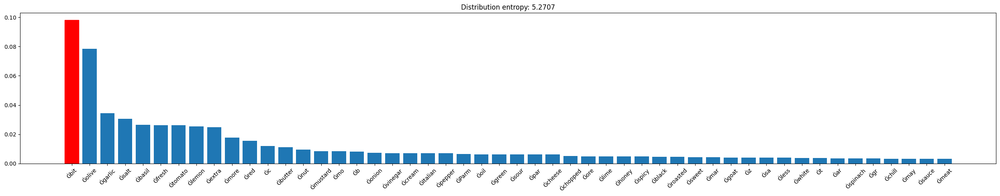

I like pesto with a little bit
tensor([56.2742, 53.7717, 46.3680,  ..., 42.8845, 45.3424, 53.2689])


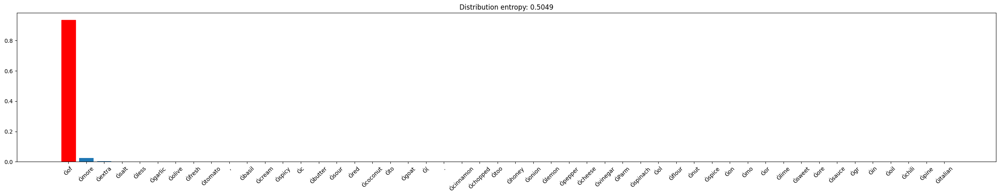

I like pesto with a little bit of
tensor([-109.7260, -110.5590, -117.7488,  ..., -121.1848, -116.8418,
        -110.8924])


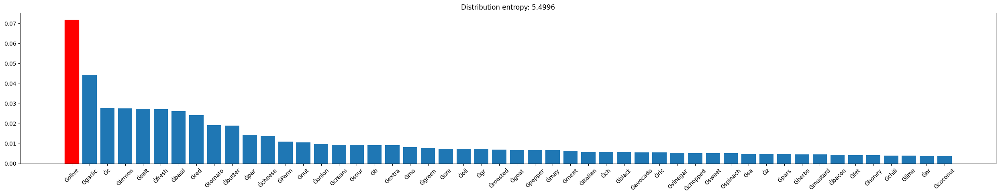

I like pesto with a little bit of olive
tensor([-48.2565, -49.5643, -57.4378,  ..., -63.7333, -59.2435, -51.1460])


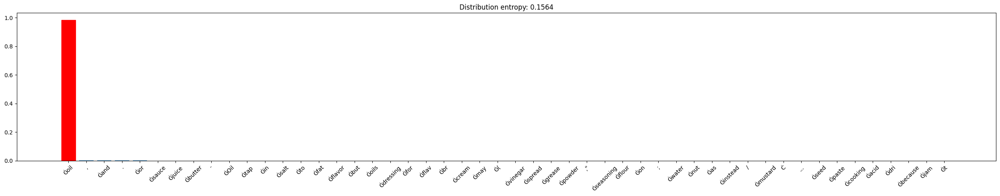

I like pesto with a little bit of olive oil
tensor([-72.3828, -74.8807, -82.2459,  ..., -91.4816, -86.6096, -76.3175])


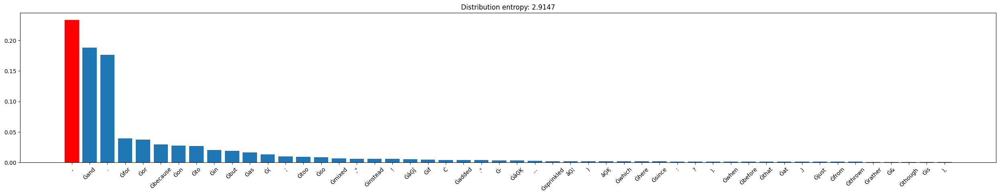

I like pesto with a little bit of olive oil,
tensor([ -95.4608,  -96.8126, -101.8261,  ..., -106.6117, -100.5597,
         -95.0220])


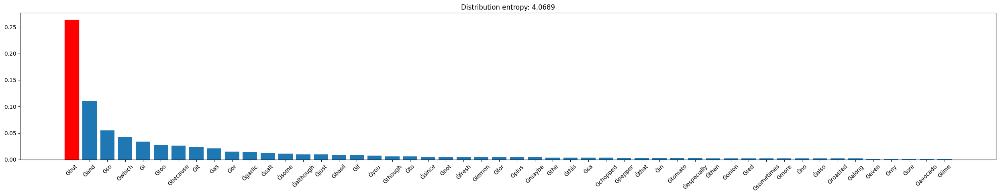

I like pesto with a little bit of olive oil, but
tensor([-105.9268, -107.4058, -112.7154,  ..., -114.8672, -112.5005,
        -108.4285])


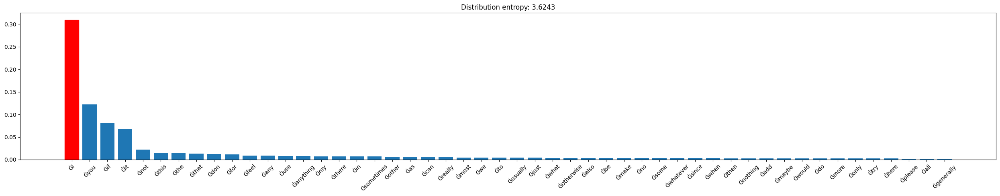

I like pesto with a little bit of olive oil, but I
tensor([-164.6689, -162.8751, -167.7607,  ..., -174.4383, -167.5988,
        -167.0120])


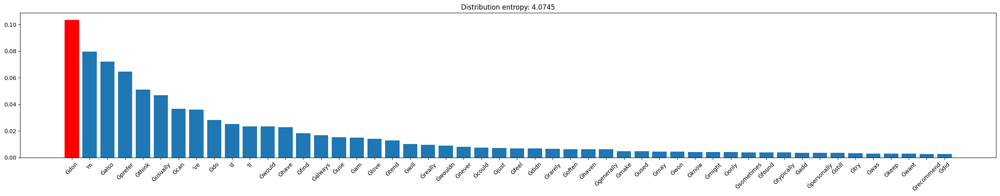

I like pesto with a little bit of olive oil, but I don
tensor([-272.4180, -272.2727, -276.9620,  ..., -308.3604, -301.5142,
        -275.3508])


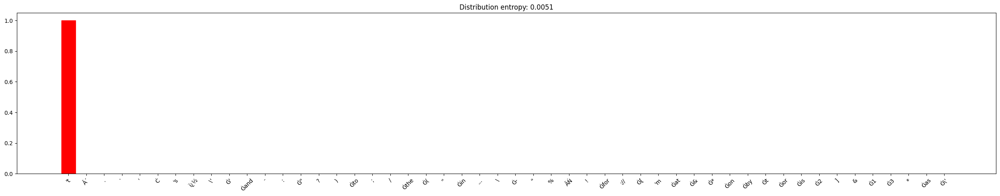

I like pesto with a little bit of olive oil, but I don't
tensor([-134.3726, -136.0206, -142.3934,  ..., -146.5018, -146.7368,
        -138.5271])


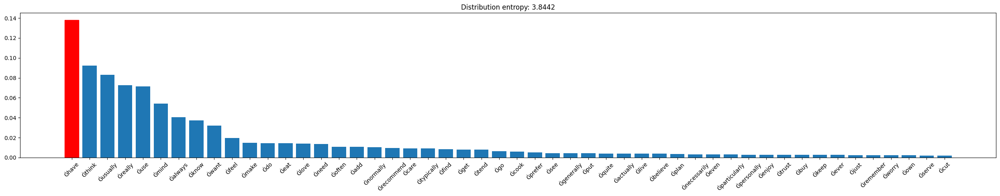

I like pesto with a little bit of olive oil, but I don't have
tensor([-84.9132, -86.6600, -93.1873,  ..., -90.8879, -92.8429, -87.6004])


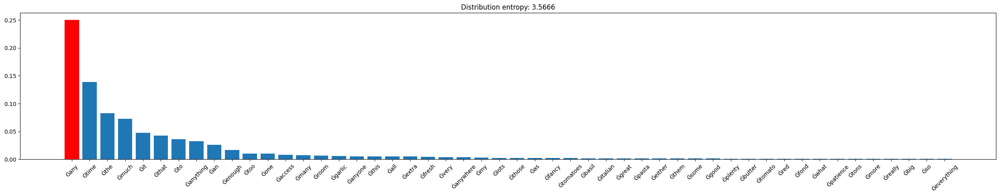

I like pesto with a little bit of olive oil, but I don't have any
tensor([-104.2390, -109.5116, -115.3152,  ..., -114.4845, -117.8697,
        -108.7379])


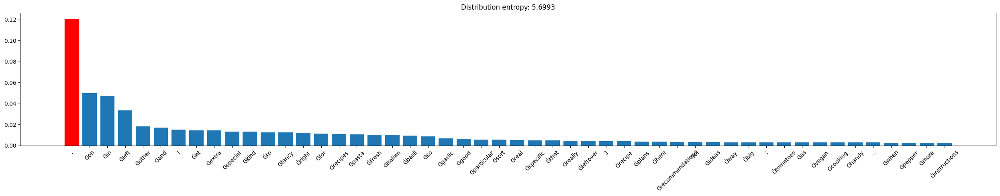

I like pesto with a little bit of olive oil, but I don't have any.
tensor([-114.5308, -114.9512, -116.8175,  ..., -129.2694, -126.5029,
        -108.4505])


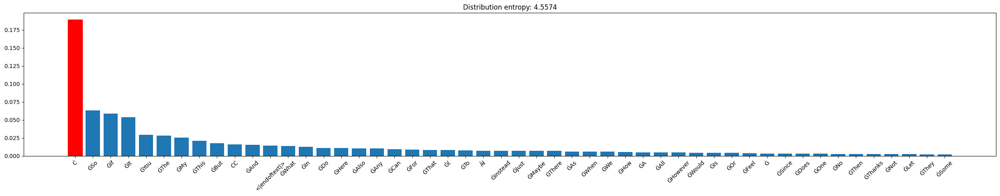

I like pesto with a little bit of olive oil, but I don't have any.

tensor([  4.0878,   8.9173,   7.0305,  ..., -10.6212,  -7.4479,   7.7516])


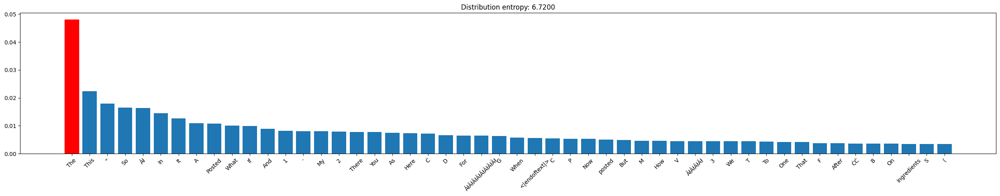

I like pesto with a little bit of olive oil, but I don't have any.
The
tensor([-91.5831, -91.3842, -94.8320,  ..., -96.8206, -95.7048, -91.3390])


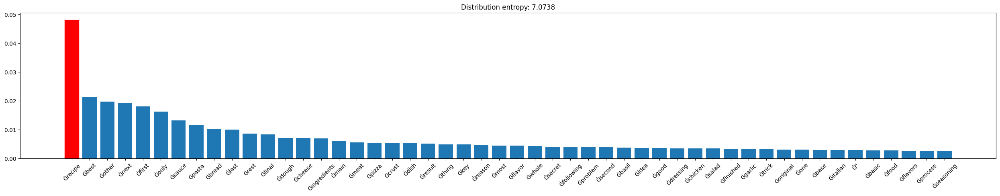

I like pesto with a little bit of olive oil, but I don't have any.
The recipe
tensor([-116.6814, -120.6280, -123.4702,  ..., -127.5394, -126.0659,
        -117.9857])


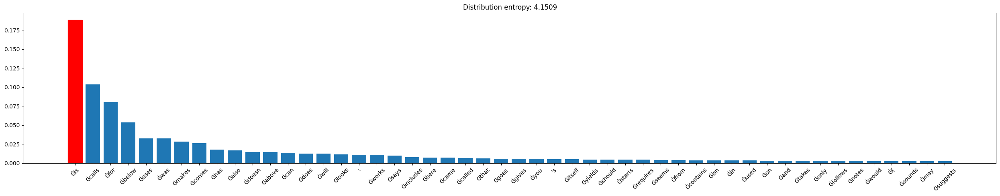

I like pesto with a little bit of olive oil, but I don't have any.
The recipe is
tensor([-130.5605, -133.2614, -137.3614,  ..., -141.3735, -138.6903,
        -131.8980])


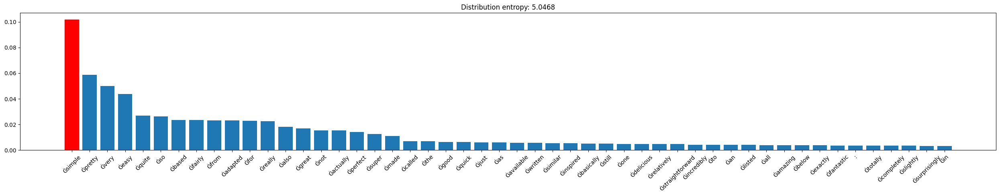

I like pesto with a little bit of olive oil, but I don't have any.
The recipe is simple
tensor([-43.4850, -49.9488, -53.0945,  ..., -60.1884, -58.4682, -49.2963])


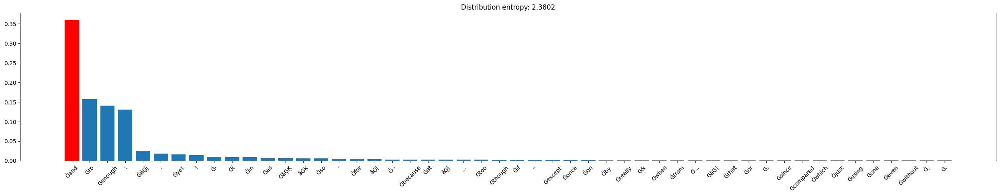

I like pesto with a little bit of olive oil, but I don't have any.
The recipe is simple and
tensor([-128.0171, -128.7716, -133.5155,  ..., -136.5762, -134.6427,
        -129.6385])


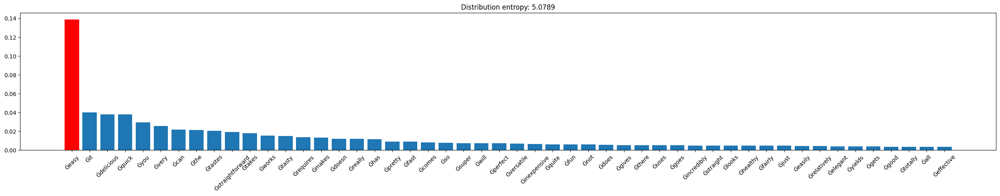

I like pesto with a little bit of olive oil, but I don't have any.
The recipe is simple and easy
tensor([-41.1557, -48.5966, -52.9649,  ..., -58.9080, -57.6906, -47.3007])


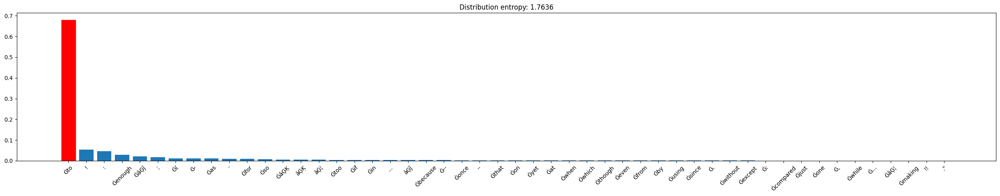

I like pesto with a little bit of olive oil, but I don't have any.
The recipe is simple and easy to
tensor([-102.1818, -103.0011, -110.8901,  ..., -112.8505, -113.8238,
        -103.3811])


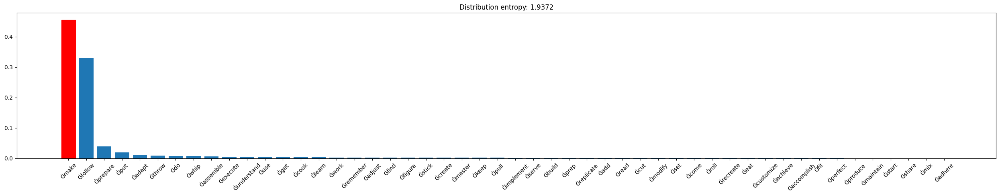

I like pesto with a little bit of olive oil, but I don't have any.
The recipe is simple and easy to make
tensor([-54.3159, -62.0973, -66.8086,  ..., -72.7983, -71.5116, -60.2199])


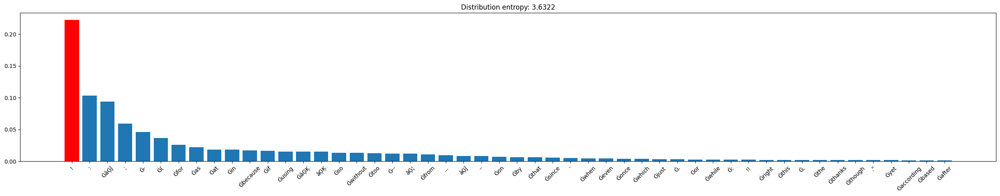

I like pesto with a little bit of olive oil, but I don't have any.
The recipe is simple and easy to make!
tensor([-120.4197, -122.4975, -124.0410,  ..., -138.6492, -134.4917,
        -113.9945])


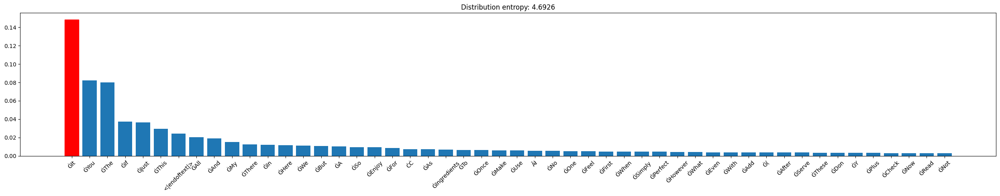

I like pesto with a little bit of olive oil, but I don't have any.
The recipe is simple and easy to make! It
tensor([-122.8520, -124.5096, -129.3424,  ..., -134.0385, -130.4837,
        -125.4430])


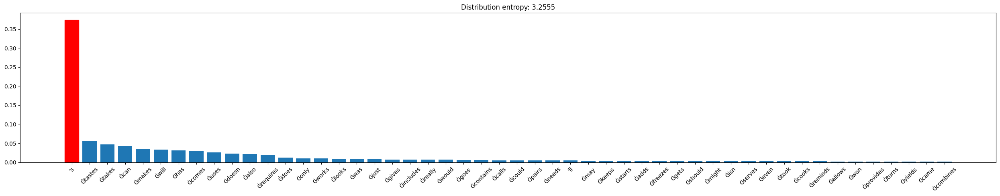

I like pesto with a little bit of olive oil, but I don't have any.
The recipe is simple and easy to make! It's
tensor([-126.8432, -129.0958, -133.7745,  ..., -137.9238, -134.4287,
        -129.4444])


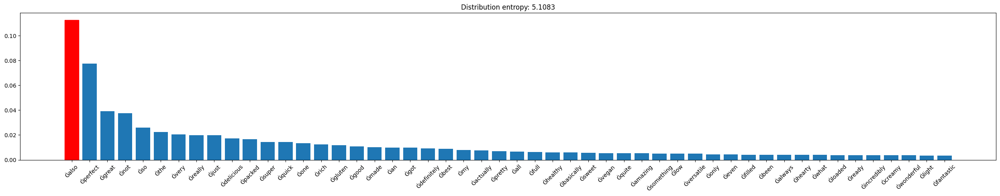

I like pesto with a little bit of olive oil, but I don't have any.
The recipe is simple and easy to make! It's also
tensor([-129.5892, -131.6373, -136.5124,  ..., -140.2390, -137.4991,
        -132.3336])


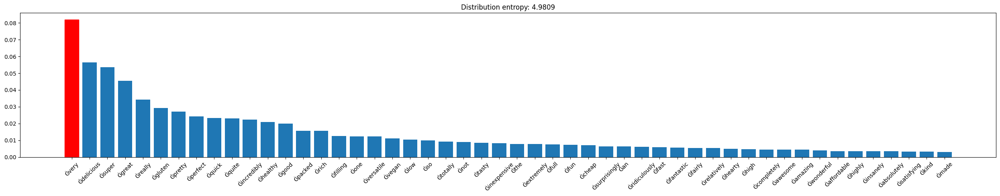

I like pesto with a little bit of olive oil, but I don't have any.
The recipe is simple and easy to make! It's also very
tensor([-125.3389, -126.6559, -132.5594,  ..., -135.8494, -134.4211,
        -128.2506])


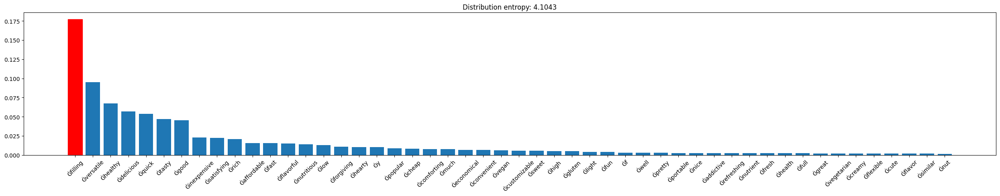

I like pesto with a little bit of olive oil, but I don't have any.
The recipe is simple and easy to make! It's also very filling
tensor([-60.6399, -71.0872, -74.9814,  ..., -82.8441, -79.7190, -69.2790])


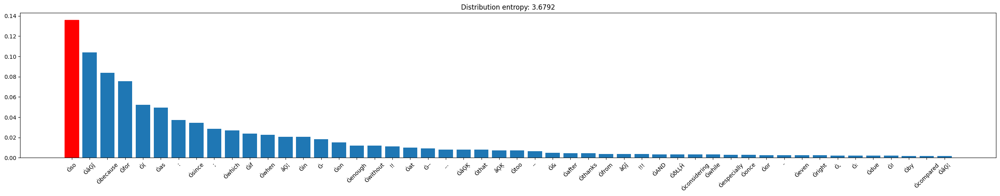

I like pesto with a little bit of olive oil, but I don't have any.
The recipe is simple and easy to make! It's also very filling so


In [18]:
def repetition_penalty(logits, previous_tokens, penalty):
    for tok_id in set(previous_tokens.tolist()):
      if logits[tok_id] > 0:
        logits[tok_id] = logits[tok_id] / penalty
      else:
        logits[tok_id] = logits[tok_id] * penalty

    return logits


output_text = input_text

for _ in range(max_new_tokens):
    input_ids = tokenizer(output_text, return_tensors="pt").input_ids
    previous_tokens = input_ids.squeeze() # we collect the last tokens
    with torch.no_grad():
        logits = model(input_ids).logits
    next_logits = logits[0, -1, :]   # shape [vocab_size]
    print(next_logits)
    next_logits = repetition_penalty(next_logits, previous_tokens, 2.0)

    tok_id = greedy_generate(next_logits, True)

    output_text += tokenizer.decode([tok_id])
    print(output_text)

# the original greedy generation was:
# "I like pesto with a little bit of olive oil, but I don't like it too much. I like it a little bit more with a little bit of olive oil"

### Or we can penalize specific tokens:

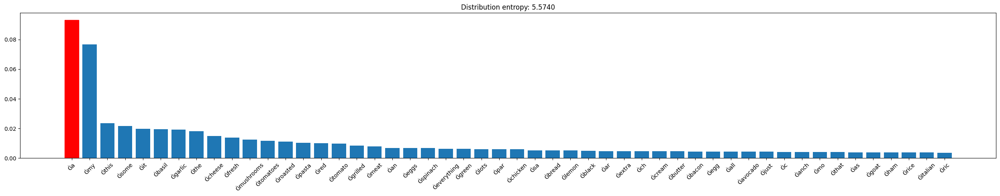

I like pesto with a


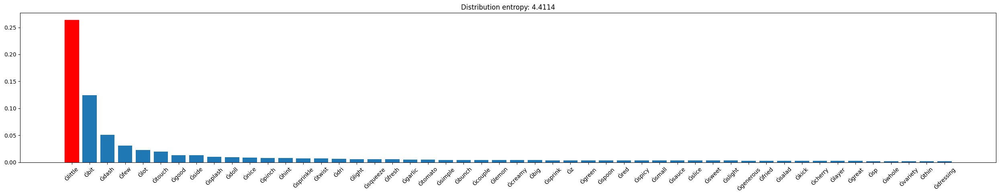

I like pesto with a little


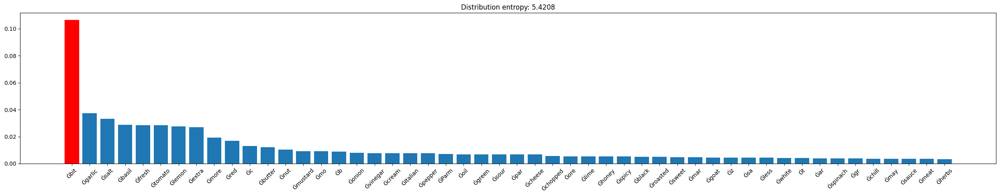

I like pesto with a little bit


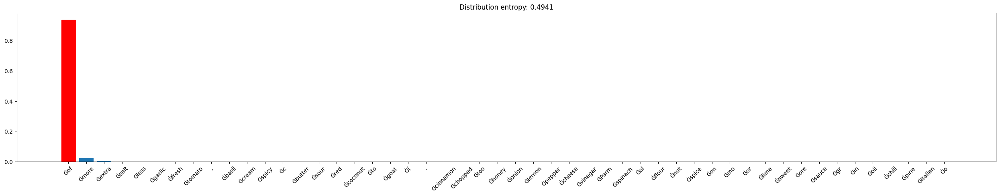

I like pesto with a little bit of


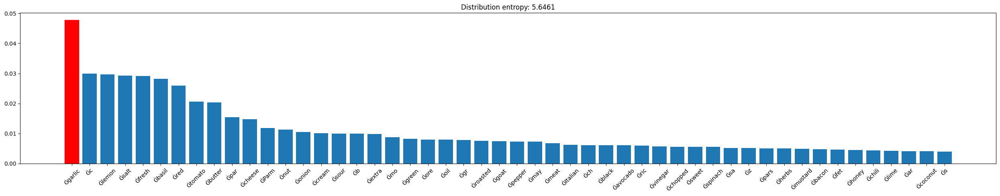

I like pesto with a little bit of garlic


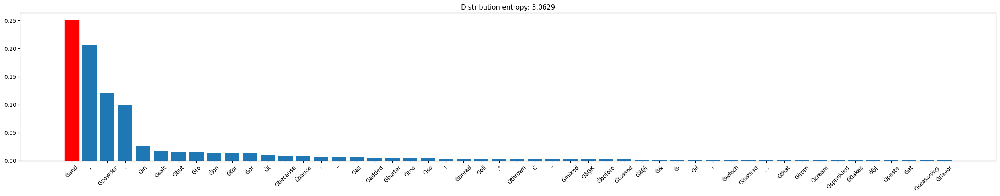

I like pesto with a little bit of garlic and


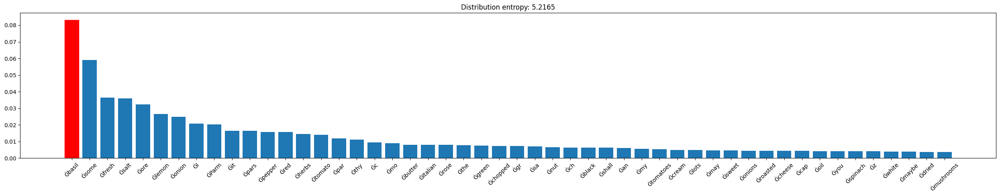

I like pesto with a little bit of garlic and basil


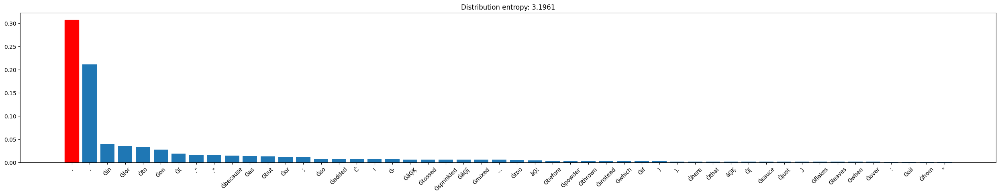

I like pesto with a little bit of garlic and basil.


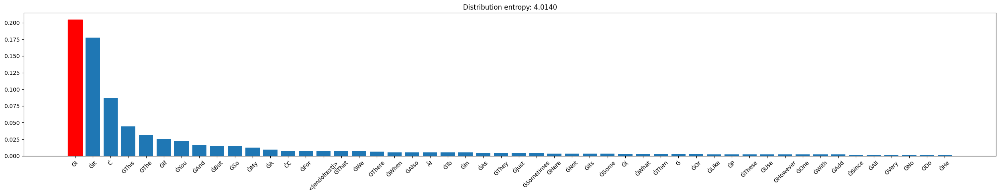

I like pesto with a little bit of garlic and basil. I


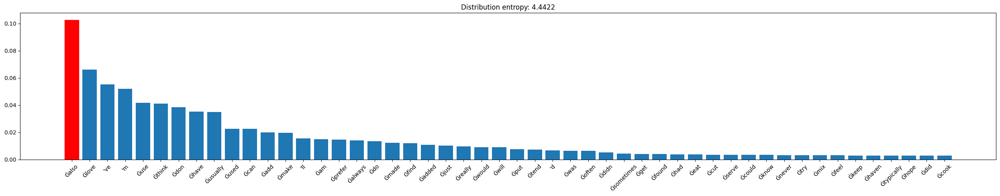

I like pesto with a little bit of garlic and basil. I also


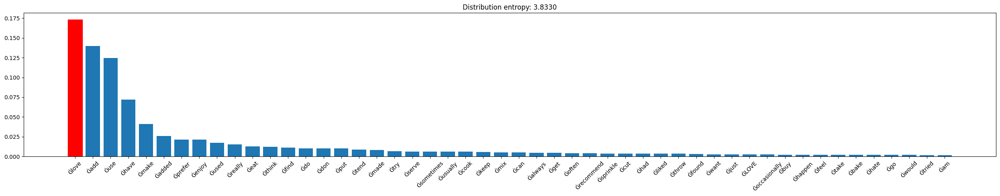

I like pesto with a little bit of garlic and basil. I also love


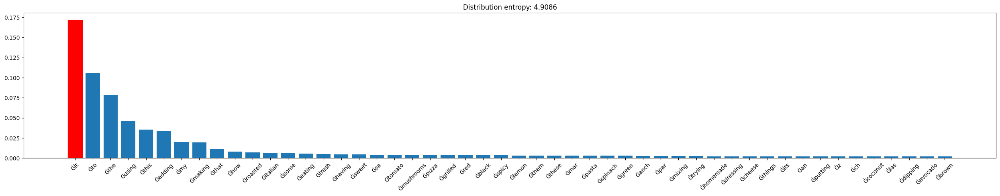

I like pesto with a little bit of garlic and basil. I also love it


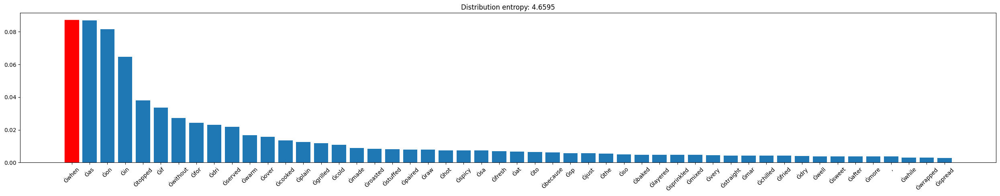

I like pesto with a little bit of garlic and basil. I also love it when


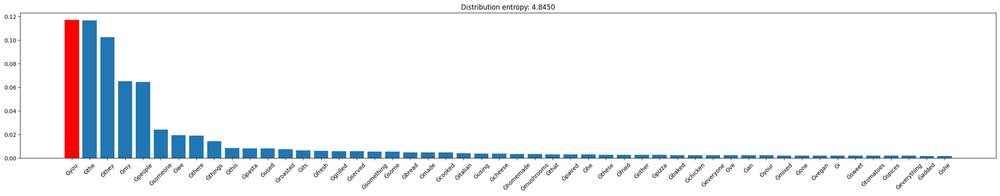

I like pesto with a little bit of garlic and basil. I also love it when you


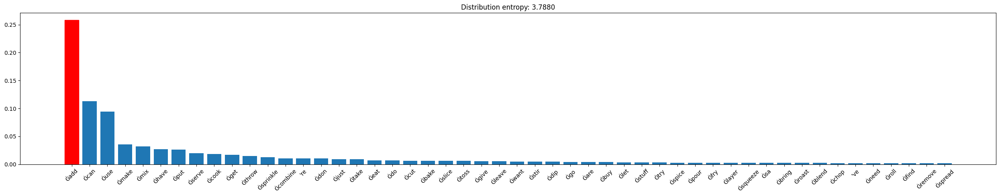

I like pesto with a little bit of garlic and basil. I also love it when you add


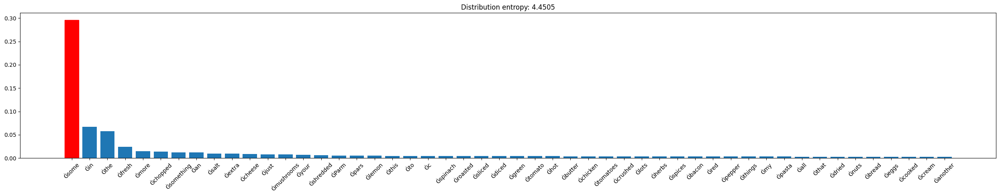

I like pesto with a little bit of garlic and basil. I also love it when you add some


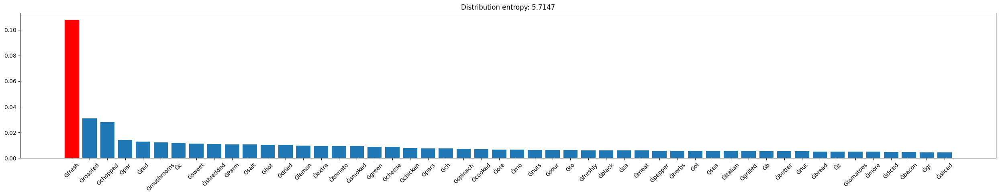

I like pesto with a little bit of garlic and basil. I also love it when you add some fresh


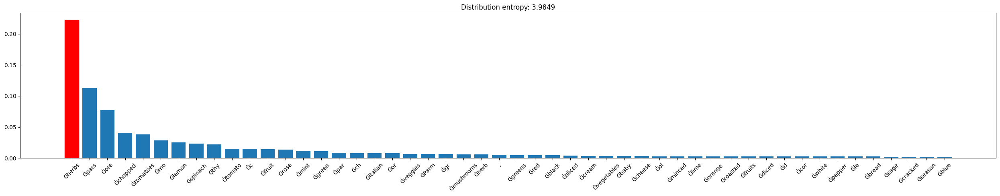

I like pesto with a little bit of garlic and basil. I also love it when you add some fresh herbs


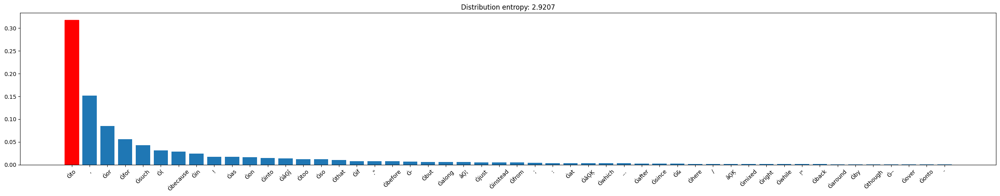

I like pesto with a little bit of garlic and basil. I also love it when you add some fresh herbs to


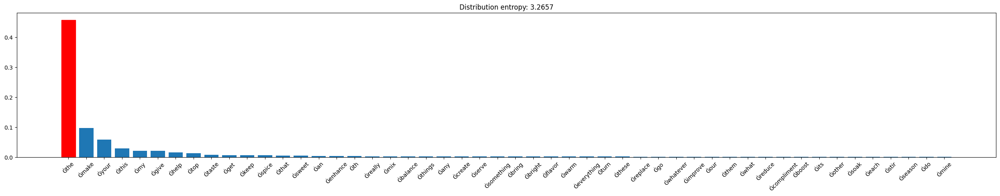

I like pesto with a little bit of garlic and basil. I also love it when you add some fresh herbs to the


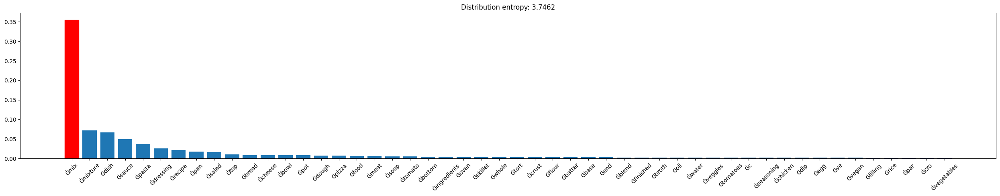

I like pesto with a little bit of garlic and basil. I also love it when you add some fresh herbs to the mix


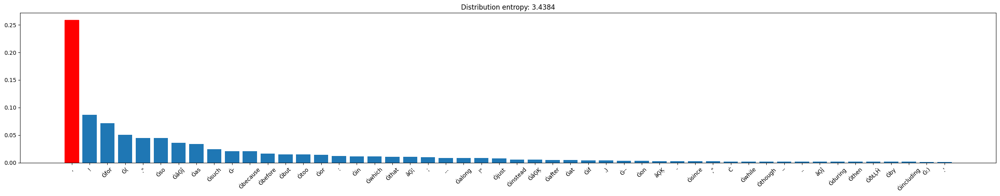

I like pesto with a little bit of garlic and basil. I also love it when you add some fresh herbs to the mix,


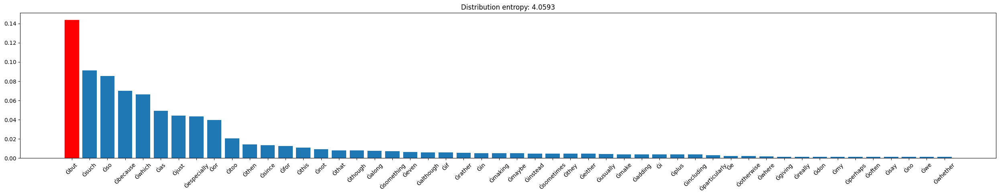

I like pesto with a little bit of garlic and basil. I also love it when you add some fresh herbs to the mix, but


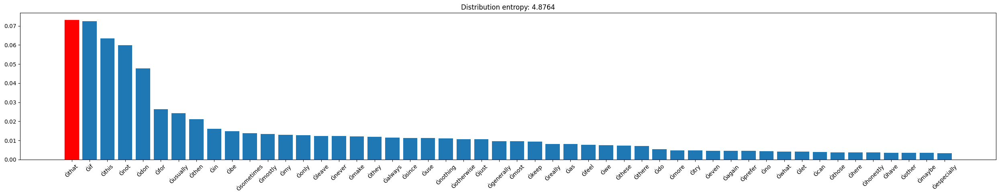

I like pesto with a little bit of garlic and basil. I also love it when you add some fresh herbs to the mix, but that


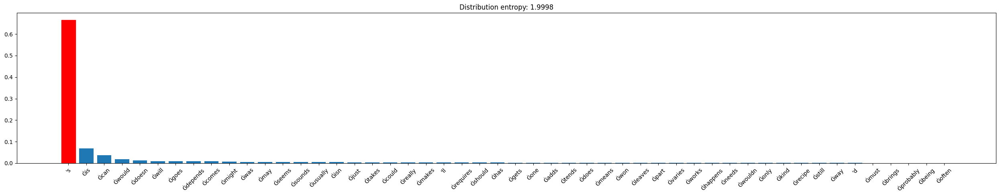

I like pesto with a little bit of garlic and basil. I also love it when you add some fresh herbs to the mix, but that's


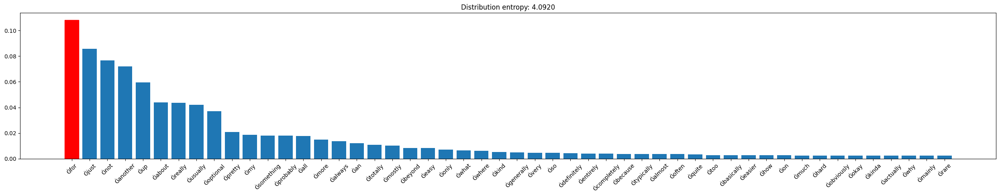

I like pesto with a little bit of garlic and basil. I also love it when you add some fresh herbs to the mix, but that's for


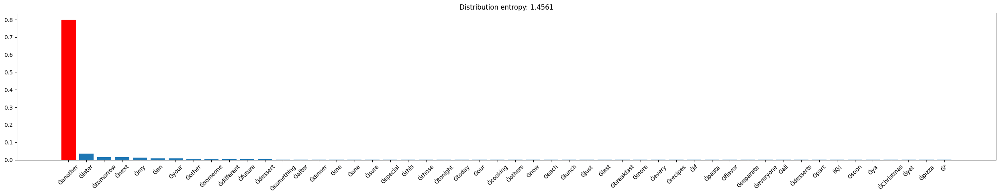

I like pesto with a little bit of garlic and basil. I also love it when you add some fresh herbs to the mix, but that's for another


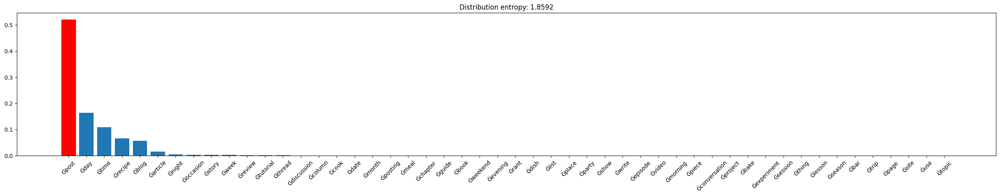

I like pesto with a little bit of garlic and basil. I also love it when you add some fresh herbs to the mix, but that's for another post


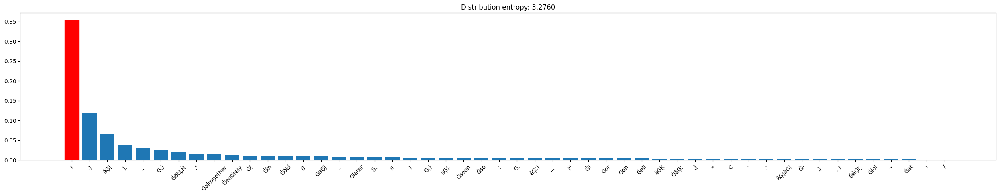

I like pesto with a little bit of garlic and basil. I also love it when you add some fresh herbs to the mix, but that's for another post!


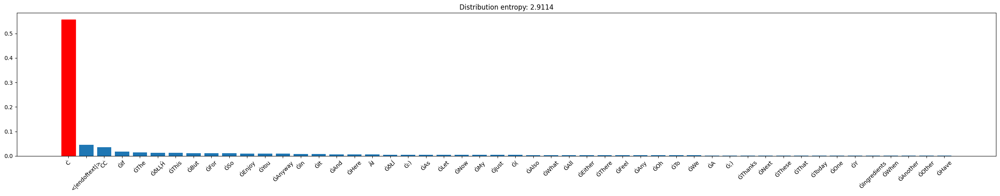

I like pesto with a little bit of garlic and basil. I also love it when you add some fresh herbs to the mix, but that's for another post!



In [19]:
def penalize_token(logits, token, penalty):
    tok_id = tokenizer(token, return_tensors="pt").input_ids[0][0].item()
    if logits[tok_id] > 0:
      logits[tok_id] = logits[tok_id] / penalty
    else:
      logits[tok_id] = logits[tok_id] * penalty

    return logits


output_text = input_text

for _ in range(max_new_tokens):
    input_ids = tokenizer(output_text, return_tensors="pt").input_ids
    previous_tokens = input_ids.squeeze() # we collect the last tokens
    with torch.no_grad():
        logits = model(input_ids).logits
    next_logits = logits[0, -1, :]   # shape [vocab_size]
    to_penalize = " olive"
    next_logits = penalize_token(next_logits, to_penalize, 2.0)
    next_logits = repetition_penalty(next_logits, previous_tokens, 2.0) # we also penalize repetitions

    tok_id = greedy_generate(next_logits, True)

    output_text += tokenizer.decode([tok_id])
    print(output_text)

# the original greedy generation was:
# "I like pesto with a little bit of olive oil, but I don't like it too much. I like it a little bit more with a little bit of olive oil"

### We can leverage logits to extract a measure of confidence of how much the model can predict the next word in a sequence. This metric is called **perplexity**, defined as the exponentiated average negative log-likelihood of a sequence:
$\text{PPL}(X) = \exp \{- \frac{1}{t} \sum^{t}_{i} \log p_{\theta} (x_{i} | x_{ \lt i}) \}$

Perplexity is typically used as an evaluation metric to assess the quality of the language distribution approximation learned by the model:
- A low perplexity on natural language texts suggests that the model is not surprised, hence the approximation is good
- A high perplexity on natural language texts suggests that the model is very surprised, hence the approximation is not good

More info: https://huggingface.co/docs/transformers/perplexity


From the famous gpt-2 paper (https://cdn.openai.com/better-language-models/language_models_are_unsupervised_multitask_learners.pdf):

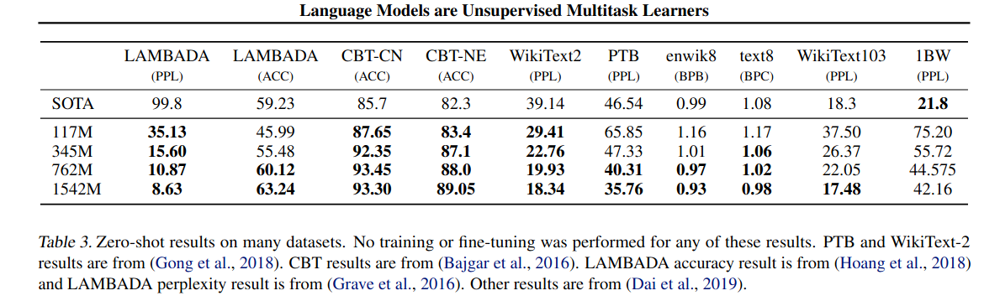

In [20]:
def compute_perplexity_for_batch(input_texts):
    # make sure we have a pad since we are working with batches
    tokenizer.pad_token = tokenizer.eos_token

    inputs = tokenizer(
        input_texts,
        return_tensors="pt",
        padding=True,
        truncation=True
    )

    input_ids = inputs["input_ids"]
    attention_mask = inputs["attention_mask"]

    with torch.no_grad():
        outputs = model(input_ids, attention_mask=attention_mask)
        logits = outputs.logits  # [B, T, V]

    # shift for next-token prediction
    shift_logits = logits[:, :-1, :]          # [B, T-1, V]
    shift_labels = input_ids[:, 1:]           # [B, T-1]
    shift_mask   = attention_mask[:, 1:]      # [B, T-1]

    # log p(token)
    log_probs = torch.nn.functional.log_softmax(shift_logits, dim=-1)
    token_log_probs = log_probs.gather(dim=-1, index=shift_labels.unsqueeze(-1)).squeeze(-1)

    # zero out padding positions
    token_log_probs = token_log_probs * shift_mask

    # length-normalized NLL per sequence
    nll_per_seq = -token_log_probs.sum(dim=-1) / shift_mask.sum(dim=-1)

    # per-token perplexity (comparable across lengths)
    ppl_per_seq = torch.exp(nll_per_seq)

    return {
        "perplexities": ppl_per_seq.tolist(),
        "mean_perplexity": ppl_per_seq.mean().item()
    }

example_texts = [
    "Pesto is a great sauce on pasta",
    "Pesto are a great sauce on pasta",
    "Pesto is a great animal in the candy shop",
]

# Compute perplexity scores for the batch of input texts
results = compute_perplexity_for_batch(example_texts)
print(f"Perplexity scores for each text: {results['perplexities']}")

Perplexity scores for each text: [62.876976013183594, 128.09335327148438, 165.11318969726562]


In [17]:
# using the transformer library is as easy as:
!pip install evaluate

example_texts = [
    "Pesto is a great sauce on pasta",
    "Pesto are a great sauce on pasta",
    "Pesto is a great animal in the candy shop",
]

from evaluate import load

perplexity = load("perplexity", module_type="metric")
results = perplexity.compute(predictions=example_texts, model_id='gpt2-medium')
print(results)

  0%|          | 0/1 [00:00<?, ?it/s]

{'perplexities': [42.004329681396484, 107.03228759765625, 128.42893981933594], 'mean_perplexity': np.float64(92.48851903279622)}


## An important resource for NLP: Speech and Language Processing (3rd ed. draft), [Dan Jurafsky and James H. Martin](https://web.stanford.edu/~jurafsky/slp3/)

This great book covers the most foundamental topics in NLP, it's free and it keeps getting updates as the filed naturally evolves.
